___

#### Group 2:
#### DJ Dawkins, Rick Fontenot, Joe Lazarus, Puri Rudick
___


# Lab 2: Classification

This Notebook will cover the following topics in order: 

1) Data preparation
* Define and prepare your class variables
* Describe the final dataset that is used for classification/regression

2) Modeling and Evaluation 
* Choose and explain your evaluation metrics
* choose method you will use for dividing your data into train-test-split
* Create three classification models
* Analyze the results
* Discuss advantages
* Which attributes are important

3) Deployment
* How useful is your model

4) Exceptional work


# Prologue

- Imports
- load data
- Data Quality 
- New Features
- Check missing values
- handling missing values
- check for duplicates

In [188]:
# Imports
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from datetime import date
import sklearn
pd.set_option("display.max_columns", None, "display.max_rows", None)
import missingno as msno


### Load the raw data

NYC Airbnb data obtained from http://data.insideairbnb.com/united-states/ny/new-york-city/2021-08-04/data/listings.csv.gz

In [189]:
# Load Raw Data
listings=pd.read_csv("https://raw.githubusercontent.com/rickfontenot/airbnb/main/airbnb_nyc_listings.csv?token=ARN5NNHQQO5DGH6T72FBV2DBGD342")

listings.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2595,https://www.airbnb.com/rooms/2595,20210804005827,2021-08-04,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,Jennifer,2008-09-09,"New York, New York, United States",A New Yorker since 2000! My passion is creatin...,NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/50fc5...,https://a0.muscache.com/im/pictures/user/50fc5...,Midtown,6.0,6.0,"['email', 'phone', 'reviews', 'offline_governm...",t,t,"New York, United States",Midtown,Manhattan,40.75356,-73.98559,Entire rental unit,Entire home/apt,1,NaN,1 bath,NaN,1.0,"[""Essentials"", ""Extra pillows and blankets"", ""...",$150.00,30,1125,30.0,30.0,1125.0,1125.0,30.0,1125.0,NaN,t,6,36,66,341,2021-08-04,48,0,0,2009-11-21,2019-11-04,4.70,4.72,4.62,4.76,4.79,4.86,4.41,NaN,f,3,3,0,0,0.34
1,3831,https://www.airbnb.com/rooms/3831,20210804005827,2021-08-04,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,LisaRoxanne,2008-12-07,"New York, New York, United States",Laid-back Native New Yorker (formerly bi-coast...,within a day,50%,88%,f,https://a0.muscache.com/im/users/4869/profile_...,https://a0.muscache.com/im/users/4869/profile_...,Clinton Hill,1.0,1.0,"['email', 'phone', 'reviews', 'offline_governm...",t,t,"Brooklyn, New York, United States",Bedford-Stuyvesant,Brooklyn,40.68494,-73.95765,Entire guest suite,Entire home/apt,3,NaN,1 bath,1.0,3.0,"[""Essentials"", ""TV with standard cable"", ""Baby...",$75.00,1,730,1.0,1.0,1125.0,1125.0,1.0,1125.0,NaN,t,0,1,7,212,2021-08-04,408,68,0,2015-01-05,2021-06-29,4.46,4.59,4.50,4.79,4.81,4.72,4.65,NaN,f,1,1,0,0,5.09
2,5121,https://www.airbnb.com/rooms/5121,20210804005827,2021-08-04,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,Garon,2009-02-03,"New York, New York, United States","I am an artist(painter, filmmaker) and curato...",within a day,100%,NaN,f,https://a0.muscache.com/im/pictures/user/72a61...,https://a0.muscache.com/im/pictures/user/72a61...,Bedford-Stuyvesant,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",t,t,NaN,Bedford-Stuyvesant,Brooklyn,40.68535,-73.95512,Private room in rental unit,Private room,2,NaN,NaN,1.0,1.0,"[""Long term stays allowed"", ""Air conditioning""...",$60.00,30,730,30.0,30.0,730.0,730.0,30.0,730.0,NaN,t,30,60,90,365,2021-08-04,50

In [190]:
# Examin Data types
listings.dtypes


id                                                int64
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
name                                             object
description                                      object
neighborhood_overview                            object
picture_url                                      object
host_id                                           int64
host_url                                         object
host_name                                        object
host_since                                       object
host_location                                    object
host_about                                       object
host_response_time                               object
host_response_rate                               object
host_acceptance_rate                             object
host_is_superhost                               

**Boolean Variables**: 

The data comes with (4) variables with "t", "f". Pandas doesn't recognize this as a Boolean Value. What we need to do is replace them with actual boolean values (True/False) that pandas recognizes while preserving NA to be converted to boolean. 
- **host_is_superhost** (target variable)	
- host_has_profile_pic	
- host_identity_verified	
- has_availability	
- instant_bookable

In [191]:
#Create function to convert t/f to boolean, included if statement so it doesn't error if run multiple times
def tf_to_bool(dataframe, variable,name):
    if str(variable.dtypes)!='boolean':
        dataframe["temp_boolean"]=np.nan
        dataframe.temp_boolean = dataframe.temp_boolean.astype('boolean')
        dataframe.temp_boolean = np.where(
            variable == 't', True, np.where(
            variable ==  'f', False, np.nan))
        dataframe.temp_boolean = dataframe.temp_boolean.astype('boolean')
        dataframe = dataframe.drop(name, axis=1)    
        dataframe.rename({'temp_boolean': name}, axis=1, inplace=True)
        return dataframe
    else:
        return dataframe

listings = tf_to_bool(listings,listings.host_is_superhost,'host_is_superhost')
listings = tf_to_bool(listings,listings.host_has_profile_pic,'host_has_profile_pic')
listings = tf_to_bool(listings,listings.host_identity_verified,'host_identity_verified')
listings = tf_to_bool(listings,listings.has_availability,'has_availability')
listings = tf_to_bool(listings,listings.instant_bookable,'instant_bookable')

### Regular Expressions
**Price** : our other target variable, is currently an object data type. We need to convert this to a floating point integer. This requires the use of a regular expression to remove "$" and "," from string and convert to float.

In [192]:
print(listings.price.dtypes) #initial type is object
print(listings.price.loc[[299]]) #original value "$2,500.00"
listings.price = listings.price.replace('[\$,]', '', regex=True).astype(float)
print(listings.price.dtypes) #transformed type is float64
print(listings.price.loc[[299]]) #new value is 2500.0

object
299    $2,500.00
Name: price, dtype: object
float64
299    2500.0
Name: price, dtype: float64


**Percentage signs**
Columns with percentages need "%" removed to convert to numeric:
- host_response_rate
- host_acceptance_rate

In [193]:
print(listings.host_response_rate.dtypes) #initial type is object
print(listings.host_response_rate.loc[[299]]) #original value "100%"
listings.host_response_rate = listings.host_response_rate.replace('%', '', regex=True).astype(float)
listings.host_acceptance_rate = listings.host_acceptance_rate.replace('%', '', regex=True).astype(float)
print(listings.host_response_rate.dtypes) #transformed type is float64
print(listings.host_response_rate.loc[[299]]) #new value is 100.0

object
299    100%
Name: host_response_rate, dtype: object
float64
299    100.0
Name: host_response_rate, dtype: float64


**Date Variables**  need to be converted based on string format before updating the data type. All the date columns are using the same military date format which is a numerical representation of year-month-day seperated by a hyphon. EG 2012-01-01 is January first, two thousand twelve. The same strategy can be applied to each of the following date columns: 
- last_scraped
- host_since
- calendar_last_scraped
- first_review
- last_review

In [194]:
date_vars = ['last_scraped','host_since','calendar_last_scraped','first_review','last_review']
listings[date_vars] =  listings[date_vars].apply(pd.to_datetime, format='%Y-%m-%d', errors ='coerce')


**Text Parsing**  bathrooms_text in its current form is not atomized. Meaning it contains more than more piece of information. It contains the Numeric quantity bathrooms and string values describing if it is shared or private. Create dictionary to parse strings and create two new variables of correct type.<br>
<br />

This work goes beyond the scope of data type and into **Data Quality** and **New Features** If we decide to present this for credit, we will present this work again in those sections.<br>
<br/>
Two new columns are being created from *bathroom_text*: **num_baths** and **bath_type**
- **num_baths** will be a floating point value
- **bath_type** will be a categorical value.

In [195]:
#convert nAn values to 'NA' for parsing, will change back to nAn after splitting
listings['bathrooms_text'] = listings['bathrooms_text'].astype(object).replace(np.nan, 'NA')

#Create translation dictionary since description formats are not consistent
transdict = {'1 bath': '1 private', 
             'NA': 'NA',
             '1.5 baths': '1.5 private',
             '1 shared bath': '1 shared', 
             '1 private bath': '1 private',
             'Shared half-bath': '0.5 shared',
             '2 baths': '2 private',
             '1.5 shared baths': '1.5 shared',
             '3 baths': '3 private',
             'Half-bath': '0.5 private',
             '2.5 baths': '2.5 private', 
             '2 shared baths': '2 shared',
             '0 baths' : '0 private',
             '4 baths':'4 private', 
             '0 shared baths': '0 shared',
             'Private half-bath': '0.5 private',  
             '4.5 baths' :'4.5 private', 
             '5.5 baths': '5.5 private' , 
             '2.5 shared baths': '2.5 shared',
             '3.5 baths': '3.5 private', 
             '15.5 baths': '15.5 private', 
             '5 baths': '5 private', 
             '3 shared baths': '3 shared', 
             '4 shared baths': '4 shared',
             '6 baths': '6 private', 
             '3.5 shared baths': '3.5 private', 
             '6 shared baths' : '6 shared',
             '6.5 shared baths': '6.5 shared', 
             '4.5 shared baths' :'4.5 private',
             '5.5 shared baths' : '5.5 private', 
             '7.5 baths': '7.5 private', 
             '5 shared baths': '5 shared',
             '6.5 baths': '6.5 private', 
             '8 baths': '8 private', 
             '7 shared baths':'7 shared', 
             '7 baths': '7 private', 
             '10 baths': '10 private'}

#use trandict to iterate over bathrooms_text column
listings['bathrooms_text'] = [transdict[letter] for letter in listings['bathrooms_text']]

#use str.split to create two new columns 'num_baths' and 'bath_type'
listings[['num_baths','bath_type']] = listings['bathrooms_text'].str.split(' ', 1, expand = True)

#For num_baths convert 'NA' values back to nan and convert type to float
listings['num_baths'] = listings['num_baths'].astype(object).replace( 'NA',np.nan)
listings['num_baths'] = listings['num_baths'].astype(np.float16)

#For bath type convert 'NA' values back to nan and convert type to category
listings.bath_type.fillna(value=np.nan, inplace=True)
listings['bath_type'] = listings['bath_type'].astype('category')
 


### Dropping bathroom_text 
num_baths and bath_type now represent the data that was contained in bathroom_text

In [196]:
#Confirm conversions for bathroom text
print(listings.num_baths.dtypes) #transformed type is float16
print(listings.num_baths.unique())
print(listings.bath_type.dtypes) #transformed type is category
print(listings.bath_type.unique()) 

#Drop original bathrooms_text column now that replaced by two new variables
listings.drop('bathrooms_text', axis=1, inplace=True)

float16
[ 1.   nan  1.5  0.5  2.   3.   2.5  0.   4.   4.5  5.5  3.5 15.5  5.
  6.   6.5  7.5  8.   7.  10. ]
category
['private', NaN, 'shared']
Categories (2, object): ['private', 'shared']


### Check Work
Check current data types for all variables before converting to desired types

In [197]:
print(listings.dtypes)

id                                                       int64
listing_url                                             object
scrape_id                                                int64
last_scraped                                    datetime64[ns]
name                                                    object
description                                             object
neighborhood_overview                                   object
picture_url                                             object
host_id                                                  int64
host_url                                                object
host_name                                               object
host_since                                      datetime64[ns]
host_location                                           object
host_about                                              object
host_response_time                                      object
host_response_rate                                     

### Data Type Dictionary
In this step we are coercing the pandas to recognize the columns in the data type that best represents each particular type of observation.<br>
<br />
To do so Data Type dictionary is created and convert all variables to proper format and bit sizes based on the key value pair.

In [198]:
convert_dict = {'id': 'Int16',
'scrape_id': 'Int64',
'last_scraped': 'datetime64[ns]',
'host_id': 'Int16',
'host_name': str,
'host_since': 'datetime64[ns]',
'calendar_last_scraped': 'datetime64[ns]',
'host_response_time': 'category',
'host_response_rate': 'float64',
'host_acceptance_rate': 'float64',
'host_is_superhost': bool,
'host_neighbourhood': 'category',
'host_listings_count': 'Int16',
'host_total_listings_count': 'Int16',
'host_verifications': str,
'host_has_profile_pic': bool,
'host_identity_verified': bool,
'neighbourhood': str,
'neighbourhood_cleansed': 'category',
'neighbourhood_group_cleansed': 'category',
'property_type': 'category',
'room_type': 'category',
'accommodates': 'Int16',
'bedrooms': 'Int16',
'beds': 'Int16',
'amenities': str,
'price': 'float64',
'minimum_nights': 'Int16',
'maximum_nights': 'Int16',
'minimum_minimum_nights': 'Int16',
'maximum_minimum_nights': 'Int16',
'minimum_maximum_nights': 'Int16',
'maximum_maximum_nights': 'Int16',
'minimum_nights_avg_ntm': 'Int16',
'maximum_nights_avg_ntm': 'Int16',
'has_availability': bool,
'availability_30': 'Int16',
'availability_60': 'Int16',
'availability_90': 'Int16',
'availability_365': 'Int16',
'number_of_reviews': 'Int16',
'number_of_reviews_ltm': 'Int16',
'number_of_reviews_l30d': 'Int16',
'first_review': 'datetime64[ns]',
'last_review': 'datetime64[ns]',
'review_scores_rating': 'float64',
'review_scores_accuracy': 'float64',
'review_scores_cleanliness': 'float64',
'review_scores_checkin': 'float64',
'review_scores_communication': 'float64',
'review_scores_location': 'float64',
'review_scores_value': 'float64',
'instant_bookable': bool,
'calculated_host_listings_count': 'Int16',
'calculated_host_listings_count_entire_homes': 'Int16',
'calculated_host_listings_count_private_rooms': 'Int16',
'calculated_host_listings_count_shared_rooms': 'Int16',
'reviews_per_month': 'float64',
'num_baths': 'float64',
'bath_type': 'category'
               }
  
listings = listings.astype(convert_dict, errors='ignore')
print(listings.dtypes)

id                                                       int64
listing_url                                             object
scrape_id                                                Int64
last_scraped                                    datetime64[ns]
name                                                    object
description                                             object
neighborhood_overview                                   object
picture_url                                             object
host_id                                                  int64
host_url                                                object
host_name                                               object
host_since                                      datetime64[ns]
host_location                                           object
host_about                                              object
host_response_time                                    category
host_response_rate                                     

### Removing columns we cannot interpret 
There's a lot of information for each listing. We only want to keep the most relevant data. The data set did not come with a definition of terms. Some columns we are not able to work out what they represent. Thus we will remove these columns and not present them in the Data Meaning and Type. 


- minimum_minimum_nights                             
- maximum_minimum_nights                             
- minimum_maximum_nights                             
- maximum_maximum_nights                             
- minimum_nights_avg_ntm                             
- maximum_nights_avg_ntm   
- calculated_host_listings_count_entire_homes
- calculated_host_listings_count_private_rooms
- calculated_host_listings_count_shared_rooms

In [199]:
listings.drop(['minimum_minimum_nights','maximum_minimum_nights','minimum_maximum_nights',
               'maximum_maximum_nights' ,'minimum_nights_avg_ntm','maximum_nights_avg_ntm',
               'calculated_host_listings_count_shared_rooms', 'calculated_host_listings_count_entire_homes',
               'calculated_host_listings_count_private_rooms'], axis=1, inplace = True)

### Removing columns we don't intend to work with
There's a lot of information for each listing. We only want to keep the most relevant data. There are columns we do not intend to use in our analysis 
- listing_url
- scrape_id
- name
- picture_url
- host_url
- host_thumbnail_url
- host_picture_url

In [200]:
listings.drop(['listing_url','scrape_id','picture_url','host_url','host_thumbnail_url',
               'host_total_listings_count','host_picture_url','calendar_last_scraped'], axis=1, inplace = True)

### Check missing values
This check is done to ensure we've preserved the data integrity and its missing values.

In [201]:
listings.isna().sum()

id                                    0
last_scraped                          0
name                                 13
description                        1236
neighborhood_overview             14133
host_id                               0
host_name                             0
host_since                           23
host_location                       119
host_about                        15032
host_response_time                15676
host_response_rate                15676
host_acceptance_rate              15186
host_neighbourhood                 6871
host_listings_count                  23
host_verifications                    0
neighbourhood                         0
neighbourhood_cleansed                0
neighbourhood_group_cleansed          0
latitude                              0
longitude                             0
property_type                         0
room_type                             0
accommodates                          0
bathrooms                         36724


### Function to convert null values in neighbourhood to np.nan data type
Although the neighbourhood variable showed 0 NA in the isna() summary tables we noticed through viewing the data that many were missing. After iterating through 10 tests against the strange na type upon import, we wrote a custom function to replace them with proper np.nan so that it would show up in the missing value reports and could be imputed.


In [202]:
# Missing values for neighbourhood not recognized by .isna, replace them with np.nan for further analysis.
def f(row):
    if str(row['neighbourhood']) == 'nan':
        val = np.nan
    else:
        val = row['neighbourhood']
    return val

listings['neighbourhood'] = listings.apply(f, axis=1)

# Then run .isna summary again
listings.isna().sum()


id                                    0
last_scraped                          0
name                                 13
description                        1236
neighborhood_overview             14133
host_id                               0
host_name                             0
host_since                           23
host_location                       119
host_about                        15032
host_response_time                15676
host_response_rate                15676
host_acceptance_rate              15186
host_neighbourhood                 6871
host_listings_count                  23
host_verifications                    0
neighbourhood                     14132
neighbourhood_cleansed                0
neighbourhood_group_cleansed          0
latitude                              0
longitude                             0
property_type                         0
room_type                             0
accommodates                          0
bathrooms                         36724


## Preserving variables with missing values

For variables with  less than 1,000 missing values (less than 2.7% of observations), we chose not to impute. It may be the case that the lack of data is data in and of itself. Guests may be influenced by the lack of data when choosing a listing. During our analyses we will consider this. In certain cases we may filter. <br><br /> Those variables are:
* name
* host_since
* host_location
* host_thumbnail_url
* host_picture_url
* host_listings_count
* host_total_listings_count
* host_is_superhost
* host_has_profile_pic
* host_identity_verified
* has_availability
* instant_bookable
* num_baths (new variable)
* bath_type (new variable)

### Drop columns with 100% missing values (i.e. blank variables)

Easy decision to remove columns with no information. Getting rid of here so we don't have to discuss this in our data meaning and type write up. Didn't think you'd mind this step taking place here. 

In [203]:
listings.drop(['bathrooms','calendar_updated','license'], axis=1, inplace = True)

### Handling missing values in "Object" (string) data type 
Airbnb allows hosts to give detailed written descriptions. In some observations these text fields are blank. As mentioned before lack of data can be data in and of itself. Thus we don't want to disgard these observations. So we made a decision to give descriptions that are blank a string of "Missing".
For missing values in object and category data type variables, we didn't find correlations to other missing values or correlations to other missing values to impute. In ordered to perserve the rows we replaced missing values with "missing".

In [204]:
# Replace missing values in object data type variables.

listings.description.fillna("missing", inplace=True)
listings.neighborhood_overview.fillna("missing", inplace=True)
listings.host_about.fillna("missing", inplace=True)

### Handling missing values in "Category" data type

Similar to the text fields information can be missing. But we'd like to presrve the row. Thus for missing values in a category data type we used the following function. 

In [205]:
# Replace missing values in category data type variables.

# Function to impute null value with new category
def impute_nan_create_category(listings,ColName):
     listings[ColName] = np.where(listings[ColName].isnull(),"missing",listings[ColName])

## Call function to create new category for variables
for Columns in ['host_response_time', 'host_neighbourhood', 'neighbourhood']:
    impute_nan_create_category(listings,Columns)

### Handing missing values in "Numerical" data type
For missing value in numerical data type variables, since we could not find any correlations between the particular variables with others, we replaced all of the missing value with its mean, except for bedrooms that we replaced with it median because we want to keep its data type as integer.  For reviews_per_month, we know it is calculated from number_of_reviews/(last_scraped - first_review), so we looked at those 3 variables values, and replace the missing values with the result from the calculation.

In [206]:
# Replace missing values in numerical variables with its mean.
listings.host_response_rate.fillna(listings.host_response_rate.mean(), inplace=True)
listings.host_acceptance_rate.fillna(listings.host_acceptance_rate.mean(), inplace=True)
listings.review_scores_rating.fillna(listings.review_scores_rating.mean(), inplace=True)
listings.review_scores_accuracy.fillna(listings.review_scores_accuracy.mean(), inplace=True)
listings.review_scores_checkin.fillna(listings.review_scores_checkin.mean(), inplace=True)
listings.review_scores_cleanliness.fillna(listings.review_scores_cleanliness.mean(), inplace=True)
listings.review_scores_communication.fillna(listings.review_scores_communication.mean(), inplace=True)
listings.review_scores_location.fillna(listings.review_scores_location.mean(), inplace=True)
listings.review_scores_value.fillna(listings.review_scores_value.mean(), inplace=True)

# Replace missing values in numerical variables with its median.
listings.bedrooms.fillna(listings.bedrooms.median(), inplace=True)

### Handling missing values in Ratios
The ratio calculated by review per month will produce and error when a listing does not have a reivew yet. 


In [207]:
# Replace missing value in reviews_per_month based on value in last_scraped, first_review, and number_of_reviews.

# Check for the three columns mentioned value for null reviews_per_month
review_pMonth_vs_numReview = listings[listings['reviews_per_month'].isnull()]
review_pMonth_vs_numReview = review_pMonth_vs_numReview[['last_scraped', 'first_review', 'number_of_reviews', 'reviews_per_month']]

# All missing values in reviews_per_month has 0 number_of_reviews
review_pMonth_vs_numReview.number_of_reviews.unique()

# Replace missing value in reviews_per_month with zero
listings.reviews_per_month = listings.reviews_per_month.fillna(0)

### Datetime variable missing values
For datetime data type variables, we decided to replace missing values with current date. This is a placeholder for potential future reviews. One of the new features we'll create is reviews_duration (last_review - first_review) and this method of imputation will result in 0 for reviews_duration on these missing values

In [208]:
listings.first_review = listings.first_review.fillna(date.today())
listings.last_review = listings.last_review.fillna(date.today())

In [209]:
listings.isna().sum()


id                                  0
last_scraped                        0
name                               13
description                         0
neighborhood_overview               0
host_id                             0
host_name                           0
host_since                         23
host_location                     119
host_about                          0
host_response_time                  0
host_response_rate                  0
host_acceptance_rate                0
host_neighbourhood                  0
host_listings_count                23
host_verifications                  0
neighbourhood                       0
neighbourhood_cleansed              0
neighbourhood_group_cleansed        0
latitude                            0
longitude                           0
property_type                       0
room_type                           0
accommodates                        0
bedrooms                            0
beds                              594
amenities   

## Check for Duplicate Data

In [210]:
# Check for duplicate rows
print('Duplicate rows: ',listings.duplicated(subset=listings.columns.difference(['id'])
, keep='first').sum())


Duplicate rows:  0


This function checks for duplicate records within the data frame. None were found. We removed the ID column to prevent the primary key from deceiving the function. In the sections above we already removed columns that were near duplicates. Such as;


- minimum_minimum_nights                             
- maximum_minimum_nights                             
- minimum_maximum_nights                             
- maximum_maximum_nights                             
- minimum_nights_avg_ntm                             
- maximum_nights_avg_ntm   
- calculated_host_listings_count_entire_homes
- calculated_host_listings_count_private_rooms
- calculated_host_listings_count_shared_rooms

## New Feature: Reviews Duration

Create this from the time difference of last review minus first review. This may be a more accurate representation of how long someone has been an active host than the original host_since variable provided in the dataset which appears to be based on sign up date, not activity.

In [211]:
listings['reviews_duration'] = listings.last_review - listings.first_review
# Format is timedelta, extract the numer of days like this:
listings.reviews_duration = listings.reviews_duration.astype('timedelta64[D]')

# I decided not to inclus price_per_bed into the dataset due to over 2,000 observations with 0 and na bed
## New Feature: Price per bed

In [212]:
#listings['price_per_bed'] = listings.price / listings.beds
#listings.price_per_bed.replace([np.inf, -np.inf], np.nan, inplace=True)

## New Feature: Price per accomodation

In [213]:
listings['price_per_accomodation'] = listings.price / listings.accommodates
listings.price_per_accomodation.replace([np.inf, -np.inf], np.nan, inplace=True)

## New Features: room_privacy & domicile_type

**property_type** has two bits of information nested in it. It lets the guest know the privacy status of a listings and domicile type e.g., house, condo, villa, hotel etc. To atomize this information we will use the same strategy as bathroom text to parce out the information. 

In [214]:
#create dictionary of terms
prop_type_transdict = {'Entire rental unit' : 'entire rental-unit',
'Entire guest suite' : 'entire guest-suite', 
'Private room in rental unit' : 'private-room rental-unit',
'Private room in townhouse' : 'private-room townhouse',
'Private room in condominium (condo)': 'private-room condo', 
'Private room in loft': 'private-room loft', 
'Entire loft': 'entire loft',
'Private room in residential home': 'private-room home',
'Entire condominium (condo)': 'entire condo',
'Entire residential home': 'entire home',
'Entire townhouse': 'entire townhouse',
'Private room in bed and breakfast': 'private-room bnb',
'Entire guesthouse': 'entire guesthouse', 
'Private room in guest suite': 'private-room guest-suite',
'Bus': 'entire Bus',
'Room in boutique hotel': 'private-room boutique-hotel',
'Shared room in loft': 'shared-room loft',
'Shared room in rental unit':'shared-room rental-unit', 
'Shared room in residential home': 'shared-room home', 
'Private room': 'private-room room', 
'Private room in hostel':'private-room hostel',
'Entire place': 'entire place',
'Private room in guesthouse': 'private-room guesthouse',
'Boat': 'entire boat',
'Entire serviced apartment': 'entire serviced-apartment',
'Room in aparthotel': 'private-room aparthotel',
'Shared room in earth house': 'shared-room earth-house',
'Floor': 'entire floor',
'Shared room in hostel': 'shared-room hostel', 
'Room in serviced apartment': 'private-room serviced-apartment',
'Entire cottage': 'entire cottage',
'Shared room in condominium (condo)': 'shared-room condo',
'Private room in serviced apartment': 'private-room serviced-apartment',
'Room in hotel': 'private-room hotel',
'Private room in boat': 'private-room boat',
'Cave': 'entire cave', 
'Tiny house': 'entire tiny-house',
'Private room in floor': 'private-room floor',
'Entire bungalow': 'entire bungalow',
'Shared room in townhouse': 'shared-room townhouse',
'Houseboat': 'entire houseboat',
'Private room in bungalow': 'private-room bungalow',
'Entire villa': 'entire villa',
'Private room in resort': 'private-room resort',
'Shared room in guest suite': 'shared-room guest-suite',
'Private room in castle': 'private-room castle',
'Private room in villa': 'private-room villa',
'Shared room in floor':'shared-room floor',
'Shared room in serviced apartment':'shared-room serviced-apartment',
'Entire bed and breakfast': 'entire bnb',
'Entire home/apt': 'entire home',
'Private room in tiny house':'private-room tiny-house', 
'Private room in tent':'private-room tent',
'Private room in in-law': 'private-room in-law',
'Private room in barn': 'private-room barn',
'Camper/RV': 'entire rv',
'Room in resort':'private-room resort',
'Shared room in bed and breakfast': 'shared-room bnb',
'Private room in farm stay': 'private-room farm',
'Private room in casa particular': 'private-room home',
'Private room in dorm': 'private-room dorm',
'Room in bed and breakfast':'private-room bnb',
'Private room in camper/rv': 'private-room rv',
'Shared room in island': 'shared-room island',
'Shared room in bungalow': 'shared-room bungalow',
'Private room in earth house': 'private-room earth-house',
'Private room in cottage': 'private-room cottage',
'Lighthouse': 'entire lighthouse', 
'Private room in train': 'private-room train',
'Barn': 'entire barn',
'Private room in lighthouse': 'private-room lighthouse',
'Castle': 'entire castle',
'Tent': 'entire tent',
'Tower': 'entire tower',
'Casa particular': 'entire home'}

#use prop_type_trandict to iterate over bathrooms_text column
listings['property_type'] = [prop_type_transdict[letter] for letter in listings['property_type']]

#use str.split to create two new columns 'room_privacy' and 'domicile_type'
listings[['room_privacy','domicile_type']] = listings['property_type'].str.split(expand=True)

#convert new columns to category data type
listings['room_privacy'] = listings['room_privacy'].astype('category')
listings['domicile_type'] = listings['domicile_type'].astype('category')

### Results of property_type atomization

(3) levels of privacy extracted. 
1. Entire
    denoting guests will have the domicile to themselves.
2. private-room 
    guests will have a room to themselves but shared access to common areas with other guests or hosts
3. shared-room
    guests will possibly share a room with other guests or hosts and shared access to common areas. <br><br />

(38) different categories of domicile 
- casa particular I reduced to home (spanish for private residence)
- private room in law i left as room in law. Refers to in law suite. This is your own space on a property but is on the same property as another domicile.
- bed and breakfast is bnb
- Floor i left as floor. I could grasp the meaning of that either
- Villa remains villa since I think that describes a particular domicile that differs from home
- rental unit could be merged into apartment but it could also mean a home so i left as is. 
- serviced-apartment is probably something unique and deserves its own class outside of apartment
- townhouse remains townhouse since I think that describes a particualr domicile that differs from home. 
- aparthotel remains due to lack of understanding 

<AxesSubplot:xlabel='count', ylabel='domicile_type'>

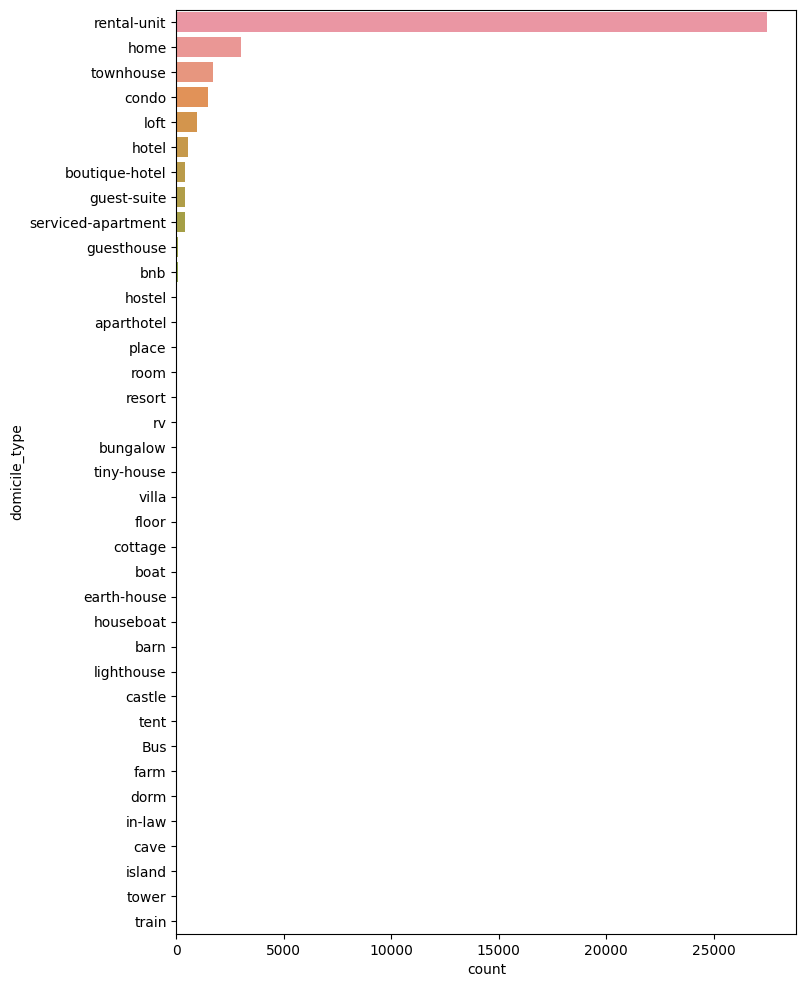

In [215]:
plt.figure(figsize = (8,12))
sns.countplot(y="domicile_type", data=listings, order = listings['domicile_type'].value_counts().index, orient='h')


### Key Observations:

Top Five domiciles types:
- Rental-Unit
- Home
- Townhouse
- Condo
- Loft

It appears many people are listing units that they might not own but, have certain rights to list on Airbnb. This makes sense for NYC many people rent apartments, instead of owning homes. To make money on the side they might stay with family or friends and list the unit.

___
# Data Preparation
___
#### [15 points total] 

> 
> ##  Define and Prepare Your Class Variables 
> 
Use proper variable representations (int, float, one-hot, etc.). Use pre-processing methods (as needed) for dimensionality reduction, scaling, etc. Remove variables that are not needed/useful for the analysis.

> #### [10 points]

In [216]:
#Check remaining missing values and drop records
listings.isna().sum()

id                                  0
last_scraped                        0
name                               13
description                         0
neighborhood_overview               0
host_id                             0
host_name                           0
host_since                         23
host_location                     119
host_about                          0
host_response_time                  0
host_response_rate                  0
host_acceptance_rate                0
host_neighbourhood                  0
host_listings_count                23
host_verifications                  0
neighbourhood                       0
neighbourhood_cleansed              0
neighbourhood_group_cleansed        0
latitude                            0
longitude                           0
property_type                       0
room_type                           0
accommodates                        0
bedrooms                            0
beds                              594
amenities   

Relatively small amount of missing values remaining after imputing in sections above. After dropping records with missing values we have 34460 records and 58 features with superhost as the target

In [217]:
listings = listings.dropna()
listings.shape


(35953, 59)

Examining Remaining columns, we will keep 'id' as an identifier and remove the following columns that are identifiers, repeate info contained in other columns, or not applicable to classification models due to too many unique values:

last_scraped
name
description
neighborhood_overview
host_id
host_name
host_since
host_location
host_about
host_verifications
neighbourhood
room_type
amenities
number_of_reviews_ltm
number_of_reviews_l30d
first_review
last_review
calculated_host_listings_count

In [218]:
listings.head()

,id,last_scraped,name,description,neighborhood_overview,host_id,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_neighbourhood,host_listings_count,host_verifications,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,reviews_per_month,host_is_superhost,host_has_profile_pic,host_identity_verified,has_availability,instant_bookable,num_baths,bath_type,reviews_duration,price_per_accomodation,room_privacy,domicile_type
0,2595,2021-08-04,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,2845,Jennifer,2008-09-09,"New York, New York, United States",A New Yorker since 2000! My passion is creatin...,missing,86.330958,75.619603,Midtown,6,"['email', 'phone', 'reviews', 'offline_governm...","New York, United States",Midtown,Manhattan,40.75356,-73.98559,entire rental-unit,Entire home/apt,1,1,1,"[""Essentials"", ""Extra pillows and blankets"", ""...",150.0,30,1125,6,36,66,341,48,0,0,2009-11-21 00:00:00,2019-11-04 00:00:00,4.70,4.72,4.62,4.76,4.79,4.86,4.41,3,0.34,False,True,True,True,False,1.0,private,3635.0,150.0,entire,rental-unit
1,3831,2021-08-04,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,4869,LisaRoxanne,2008-12-07,"New York, New York, United States",Laid-back Native New Yorker (formerly bi-coast...,within a day,50.000000,88.000000,Clinton Hill,1,"['email', 'phone', 'reviews', 'offline_governm...","Brooklyn, New York, United States",Bedford-Stuyvesant,Brooklyn,40.68494,-73.95765,entire guest-suite,Entire home/apt,3,1,3,"[""Essentials"", ""TV with standard cable"", ""Baby...",75.0,1,730,0,1,7,212,408,68,0,2015-01-05 00:00:00,2021-06-29 00:00:00,4.46,4.59,4.50,4.79,4.81,4.72,4.65,1,5.09,False,True,True,True,False,1.0,private,2367.0,25.0,entire,guest-suite
3,5136,2021-08-04,"Spacious Brooklyn Duplex, Patio + Garden",We welcome you to stay in our lovely 2 br dupl...,missing,7378,Rebecca,2009-02-03,"Brooklyn, New York, United States","Rebecca is an artist/designer, and Henoch is i...",within a day,88.000000,33.000000,Greenwood Heights,1,"['email', 'phone', 'reviews']",missing,Sunset Park,Brooklyn,40.66265,-73.99454,entire rental-unit,Entire home/apt,4,2,2,"[""TV with standard cable"", ""Long term stays al...",275.0,5,1125,7,9,9,184,1,0,0,2014-01-02 00:00:00,2014-01-02 00:00:00,5.00,5.00,5.00,5.00,5.00,4.00,5.00,1,0.01,False,True,True,True,False,1.5,private,0.0,68.75,entire,rental-unit
4,5178,2021-08-04,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",8967,Shunichi,2009-03-03,"New York, New York, United States",I used to work for a financial industry but no...,within an hour,100.000000,100.000000,Hell's Kitchen,1,"['email', 'phone', 'facebook', 'reviews']","New York, United States",Midtown,Manhattan,40.76457,-73.98317,private-room rental-unit,Private room,2,1,1,"[""Essentials"", ""Free street parking"", ""TV"", ""W...",61.0,2,14,3,7,14,255,485,12,4,2010-08-18 00:00:00,2021-07-18 00:00:00,4.20,4.19,3.71,4.65,4.40,4.86,4.35,1,3.63,False,True,False,True,False,1.0,private,3987.0,30.5,private-room,rental-unit
5,5203,2021-08-04,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,7490,MaryEllen,2009-02-05,"New York, New York, United States",Welcome to family life with my old

### **Make Host Centric Data from listings data for Classification Task**

In MiniLab we found aggregating the data by host_id produced better results. 

In [219]:
temp = listings

rating_avg = temp.groupby('host_id')['review_scores_rating'].mean()
rating_avg= rating_avg.to_frame().rename(columns={'review_scores_rating':'rating_avg'}).reset_index()

rating_max = temp.groupby('host_id')['review_scores_rating'].max()
rating_max= rating_max.to_frame().rename(columns={'review_scores_rating':'rating_max'}).reset_index()

reviews_total = temp.groupby('host_id')['number_of_reviews'].sum()
reviews_total= reviews_total.to_frame().rename(columns={'number_of_reviews':'reviews_total'}).reset_index()

host_response_time_max = temp.groupby('host_id')['host_response_time'].max()
host_response_time_max= host_response_time_max.to_frame().rename(columns={'host_response_time':'response_time_max'}).reset_index()

host_response_rate_median = temp.groupby('host_id')['host_response_rate'].median()
host_response_rate_median= host_response_rate_median.to_frame().rename(columns={'host_response_rate':'response_rate_median'}).reset_index()

acceptance_rate_median = temp.groupby('host_id')['host_acceptance_rate'].median()
acceptance_rate_median= acceptance_rate_median.to_frame().rename(columns={'host_acceptance_rate':'acceptance_rate_median'}).reset_index()

total_nyc_listings = temp.groupby('host_id')['calculated_host_listings_count'].median()
total_nyc_listings= total_nyc_listings.to_frame().rename(columns={'calculated_host_listings_count':'total_nyc_listings'}).reset_index()

accommodates_median = temp.groupby('host_id')['accommodates'].median()
accommodates_median= accommodates_median.to_frame().rename(columns={'accommodates':'accommodates_median'}).reset_index()

price_median = temp.groupby('host_id')['price'].median()
price_median= price_median.to_frame().rename(columns={'price':'price_median'}).reset_index()

availability_60_median = temp.groupby('host_id')['availability_60'].median()
availability_60_median= availability_60_median.to_frame().rename(columns={'availability_60':'availability_60_median'}).reset_index()

reviews_duration_median = temp.groupby('host_id')['reviews_duration'].median()
reviews_duration_median= reviews_duration_median.to_frame().rename(columns={'reviews_duration':'reviews_duration_median'}).reset_index()

superhost_max = temp.groupby('host_id')['host_is_superhost'].max()
superhost_max= superhost_max.to_frame().rename(columns={'host_is_superhost':'superhost_max'}).reset_index()

data_frames = [rating_avg, rating_max, reviews_total, host_response_time_max, host_response_rate_median, acceptance_rate_median, 
total_nyc_listings, accommodates_median, price_median, availability_60_median, reviews_duration_median, superhost_max]

from functools import reduce
host_df = reduce(lambda  left,right: pd.merge(left,right,on=['host_id'], how='outer'), data_frames)

host_df.head(10)

,host_id,rating_avg,rating_max,reviews_total,response_time_max,response_rate_median,acceptance_rate_median,total_nyc_listings,accommodates_median,price_median,availability_60_median,reviews_duration_median,superhost_max
0,2420,4.574993,4.574993,0,within an hour,100.000000,89.000000,1.0,5.0,802.0,21.0,0.0,True
1,2438,0.000000,0.000000,1,missing,86.330958,75.619603,1.0,4.0,95.0,0.0,0.0,False
2,2571,4.910000,4.910000,34,within an hour,100.000000,29.000000,1.0,4.0,139.0,6.0,1579.0,True
3,2782,4.574993,4.574993,0,within a day,80.000000,44.000000,1.0,4.0,95.0,0.0,0.0,False
4,2787,4.721874,5.000000,147,within an hour,100.000000,94.000000,8.0,2.0,149.0,60.0,343.0,False
5,2845,4.758331,5.000000,50,missing,86.330958,75.619603,3.0,1.0,150.0,36.0,622.0,False
6,2868,4.000000,4.000000,2,within a day,67.000000,0.000000,1.0,2.0,60.0,26.0,-225.0,False
7,2881,4.830000,4.880000,578,within an hour,100.000000,98.000000,2.0,2.0,50.0,6.5,1910.0,True
8,3757,4.574993,4.574993,0,within a day,50.000000,33.000000,1.0,2.0,350.0,3.0,0.0,False
9,4396,4.555000,4.650000,138,within a day,96.000000,59.000000,2.0,1.5,99.0,13.0,1266.5,False


### Dummy Variables for Host level data
Prepare host level data set for modeling with dummy variables for categoricals

In [220]:
Categoricals_to_convert = ['response_time_max']

# using pd get dummies for the category columns we are keeping
dummies = pd.get_dummies(host_df[Categoricals_to_convert],drop_first=True)

#dropping original columns
temp = host_df.drop(Categoricals_to_convert,axis=1)

#concating dummies to the data frame
host_df = pd.concat([temp,dummies],axis=1)

host_df.head()

,host_id,rating_avg,rating_max,reviews_total,response_rate_median,acceptance_rate_median,total_nyc_listings,accommodates_median,price_median,availability_60_median,reviews_duration_median,superhost_max,response_time_max_missing,response_time_max_within a day,response_time_max_within a few hours,response_time_max_within an hour
0,2420,4.574993,4.574993,0,100.000000,89.000000,1.0,5.0,802.0,21.0,0.0,True,0,0,0,1
1,2438,0.000000,0.000000,1,86.330958,75.619603,1.0,4.0,95.0,0.0,0.0,False,1,0,0,0
2,2571,4.910000,4.910000,34,100.000000,29.000000,1.0,4.0,139.0,6.0,1579.0,True,0,0,0,1
3,2782,4.574993,4.574993,0,80.000000,44.000000,1.0,4.0,95.0,0.0,0.0,False,0,1,0,0
4,2787,4.721874,5.000000,147,100.000000,94.000000,8.0,2.0,149.0,60.0,343.0,False,0,0,0,1



* **host_response_time** -  This column's data type is category that approximates how long it takes for a host to reply to an inquiry. The strings have a ordinal relationship. The fastest to slowest response are denoated as: “within an hour”, “within a few hours”, “within a day”, “a few days or more”. This information is available on the website to prospective guests. <br>
<br />

New (4) levels for host_response_time after creating dummy variables
1) response_time_max_missing - This column reflects those hosts who do not have any response time data. Probably emblematic of a new host. <br />
2) response_time_max_within a day - Those hosts with the longest response time. A host who will respond within a day <br />
3) response_time_max_within a few hours - Host response time generally takes a few hours to respond to inquires <br />
4) response_time_max_within an hour - Those hosts that will respond the fastest, within an hour. <br />


### Examine correlation matrix on host level data: 

<AxesSubplot:>

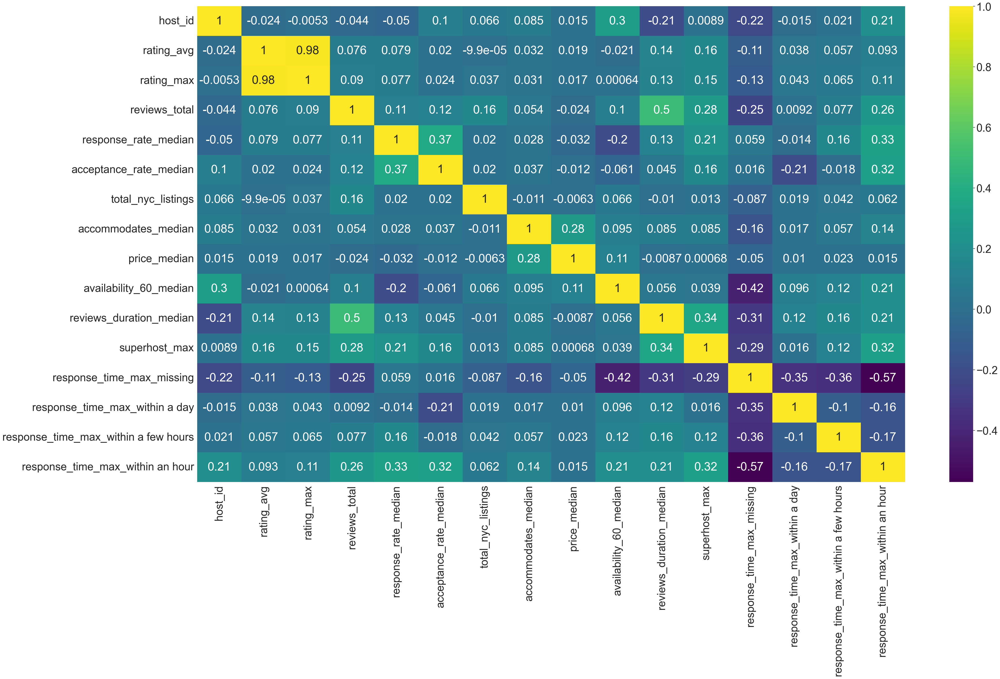

In [221]:
plt.figure(figsize=(48,26))
sns.set(font_scale=3)
sns.heatmap(host_df.corr(),annot=True,cmap='viridis')

**rating_max** and **rating_avg** are very highly correlated. 
>We will drop **rating_max**

In [222]:
host_df.drop('rating_max', axis=1, inplace=True)

### **Make Listings Subset Data from Listings Data for Regression Task**

### Variable Selection

#### Continous Variables

**Corr plot to check Multi-collinearity amongst continous variables**

<AxesSubplot:>

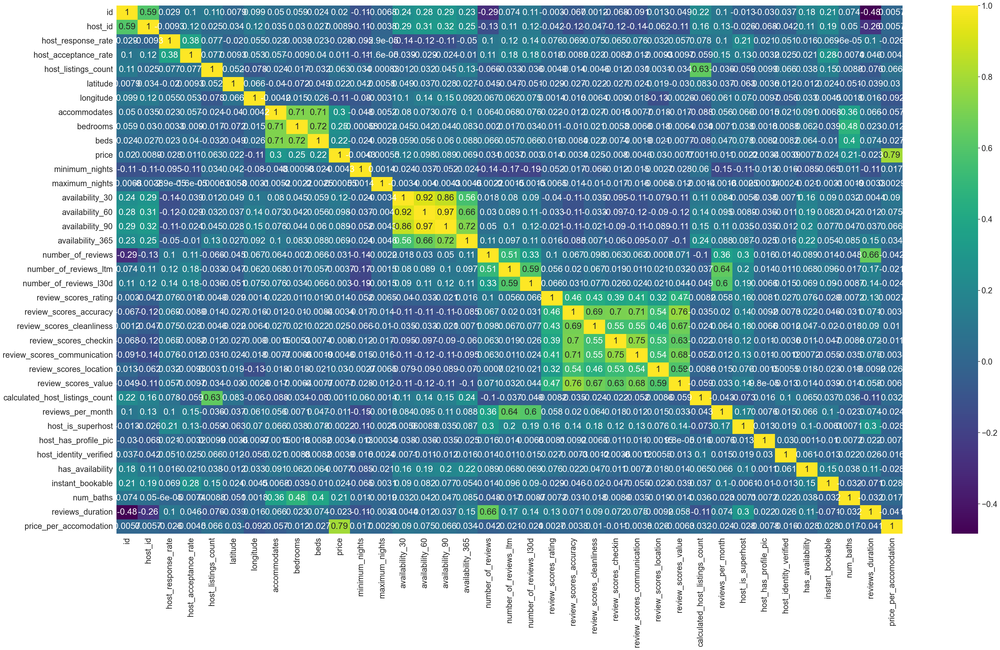

In [223]:
listings2 = listings

plt.figure(figsize=(48,26))
sns.set(font_scale=2)
sns.heatmap(listings2.corr(),annot=True,cmap='viridis')

**We can observe groupings of high correlations**

High Upper Right

- host_id
- id

That mid upper left square of green-ish yellow

- Beds
- Bedrooms
- Accomodates

That Center Grouping of mostly Yellow and green

- availablity_30
- availablity_60
- availablity_90
- availablity_365

That diagonal to the right of availablity grouping

- number_of_reviews
- number_of_reviews_ltm
- number_of_130

Down and Right from there

- review_scores_accuracy
- review_scores_cleanliness
- review_scores_checkin
- review_scores_communication
- review_scores_location
- review_scores_value

One offs

- (0.66) host_listing_count and calculated_host_listing_count
- (0.79) price and pirce_per_accommodation
- (0.66) number_of_reviews and reviews_duration
- (0.64) number_of_reviews_ltm, reviews_per_month_130d, and reviews_per_month

To determine which variables we will keep, a correlation plot of the variables against the dependent variable 'price' will inform us which varaibles have the highest correlation. We will then keep the highest ranking variable within the group to avoid multicollinearity. 

<AxesSubplot:>

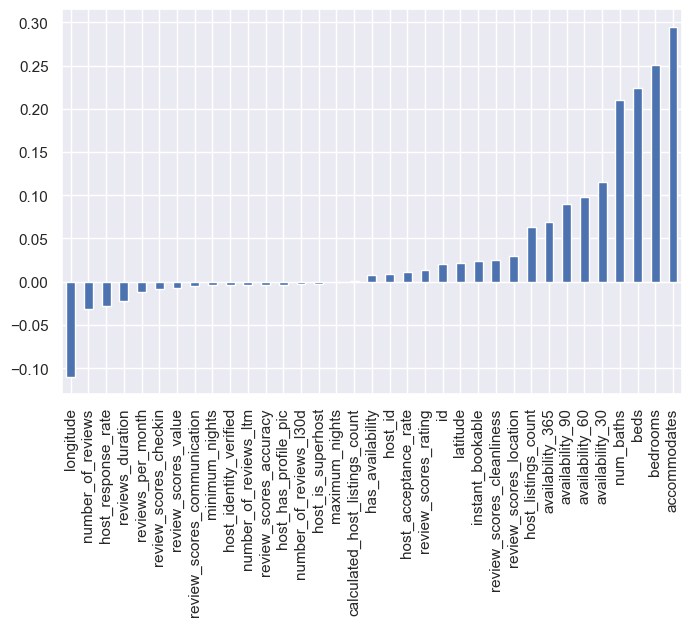

In [224]:
plt.figure(figsize = (8,5))
sns.set(font_scale=1)
listings2.corr()['price'].sort_values().drop(['price','price_per_accomodation']).plot(kind='bar') #price_per_accommodation is excluded due to it calculated from price column


**Here we are deleting variables that have high colinearity based on the observations from the correlation and which have a high ranking against price.**

1. accomodates
2. bedrooms (delete)
3. beds (delete)
4. num_bath
5. availability_30
6. availability_60 (delete)
7. availability_90 (delete)
8. availability_365 (delete)
9. host_listing_count
10. review_scores_location
11. review_scores_cleanliness (delete)
12. instant_bookable
13. latitude
14. id (delete)
15. review_scores_rating (delete)
16. host_acceptance_rating
17. host_id (delete)
18. has_availability
19. calculated_host_listings_count (delete)
20. maximum_nights (delete)
21. host_is_superhost (delete)
22. number_of_reviews_l30d (delete)
23. host_has_profile_pic
24. review_scores_accuracy (delete)
25. number_of_reviews_ltm (delete)
26. host_identity_verified
27. minimum_nights
28. review_scores_communication (delete)
29. review_scores_value (delete)
30. review_scores_checkin (delete)
31. reviewd_per_month
32. reviews_duration (delete)
33. host_response_rate
34. number_of_reviews
35. longtitude

In [225]:
drop_variables = ['price_per_accomodation','bedrooms','beds','availability_60','availability_90','availability_365','review_scores_cleanliness','id','review_scores_rating','host_id',
                  'calculated_host_listings_count','maximum_nights','host_is_superhost','number_of_reviews_l30d','review_scores_accuracy','number_of_reviews_ltm',
                  'review_scores_communication','review_scores_value','review_scores_checkin','reviews_duration','last_scraped','host_since']


listings2 = listings2.drop(drop_variables, axis=1)

print(listings2.shape)
print(listings2.columns)

(35953, 37)
Index(['name', 'description', 'neighborhood_overview', 'host_name',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_neighbourhood',
       'host_listings_count', 'host_verifications', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'amenities',
       'price', 'minimum_nights', 'availability_30', 'number_of_reviews',
       'first_review', 'last_review', 'review_scores_location',
       'reviews_per_month', 'host_has_profile_pic', 'host_identity_verified',
       'has_availability', 'instant_bookable', 'num_baths', 'bath_type',
       'room_privacy', 'domicile_type'],
      dtype='object')


### Variable Selection

#### Categorical Variables
To determine which categorical variables to drop, we look at number of unique values in each variable to see if it will be do-able for one-hot encode.

In [226]:
listings2[['name','description','neighborhood_overview','host_name','host_location','host_about','host_response_time','host_neighbourhood',
        'host_verifications','neighbourhood','neighbourhood_cleansed','neighbourhood_group_cleansed','property_type','room_type','amenities',
        'first_review','last_review','bath_type','room_privacy','domicile_type']].describe().transpose()

,count,unique,top,freq
name,35953,34905,Water View King Bed Hotel Room,27
description,35953,32744,missing,1130
neighborhood_overview,35953,18433,missing,13610
host_name,35953,8877,June,316
host_location,35953,1573,"New York, New York, United States",20989
host_about,35953,14416,missing,14529
host_response_time,35953,5,missing,15397
host_neighbourhood,35953,445,missing,6613
host_verifications,35953,528,"['email', 'phone']",3234
neighbourhood,35953,208,missing,13610


In [227]:
drop_variables2 = ['name','description','neighborhood_overview','host_name','host_location','host_about','host_neighbourhood',
                   'host_verifications','neighbourhood','neighbourhood_cleansed','property_type','amenities',
                   'first_review','last_review']


listings2 = listings2.drop(drop_variables2, axis=1)

print(listings2.shape)
print(listings2.columns)

(35953, 23)
Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_listings_count', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'room_type', 'accommodates', 'price', 'minimum_nights',
       'availability_30', 'number_of_reviews', 'review_scores_location',
       'reviews_per_month', 'host_has_profile_pic', 'host_identity_verified',
       'has_availability', 'instant_bookable', 'num_baths', 'bath_type',
       'room_privacy', 'domicile_type'],
      dtype='object')


There are 37 unique values in domicile_type.  We decided to group some of the smaller group into 'OTHER' category.

In [228]:
listings2['domicile_type']=listings2['domicile_type'].replace(['train', 'in-law', 'tower', 'island','farm', 
                                                               'cave','dorm','lighthouse','Bus','castle','tent','barn',
                                                               'earth-house','houseboat','boat','cottage','floor','villa',
                                                               'tiny-house','rv','bungalow','resort','room','place',
                                                               'aparthotel'], 'OTHER')

After looking at number of unique value categorical column, we decided to keep only host_response_time, neighbourhood_group_cleansed, room_type, bath_type, room_privacy, and domicile_type because they 

In [229]:
listings2[['host_response_time','neighbourhood_group_cleansed','room_type','bath_type','room_privacy','domicile_type']].describe().transpose()

,count,unique,top,freq
host_response_time,35953,5,missing,15397
neighbourhood_group_cleansed,35953,5,Manhattan,15734
room_type,35953,4,Entire home/apt,19242
bath_type,35953,2,private,24906
room_privacy,35953,3,entire,19207
domicile_type,35953,13,rental-unit,26926


In [230]:
listings2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35953 entries, 0 to 36723
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   host_response_time            35953 non-null  object  
 1   host_response_rate            35953 non-null  float64 
 2   host_acceptance_rate          35953 non-null  float64 
 3   host_listings_count           35953 non-null  Int16   
 4   neighbourhood_group_cleansed  35953 non-null  category
 5   latitude                      35953 non-null  float64 
 6   longitude                     35953 non-null  float64 
 7   room_type                     35953 non-null  category
 8   accommodates                  35953 non-null  Int16   
 9   price                         35953 non-null  float64 
 10  minimum_nights                35953 non-null  Int16   
 11  availability_30               35953 non-null  Int16   
 12  number_of_reviews             35953 non-null  

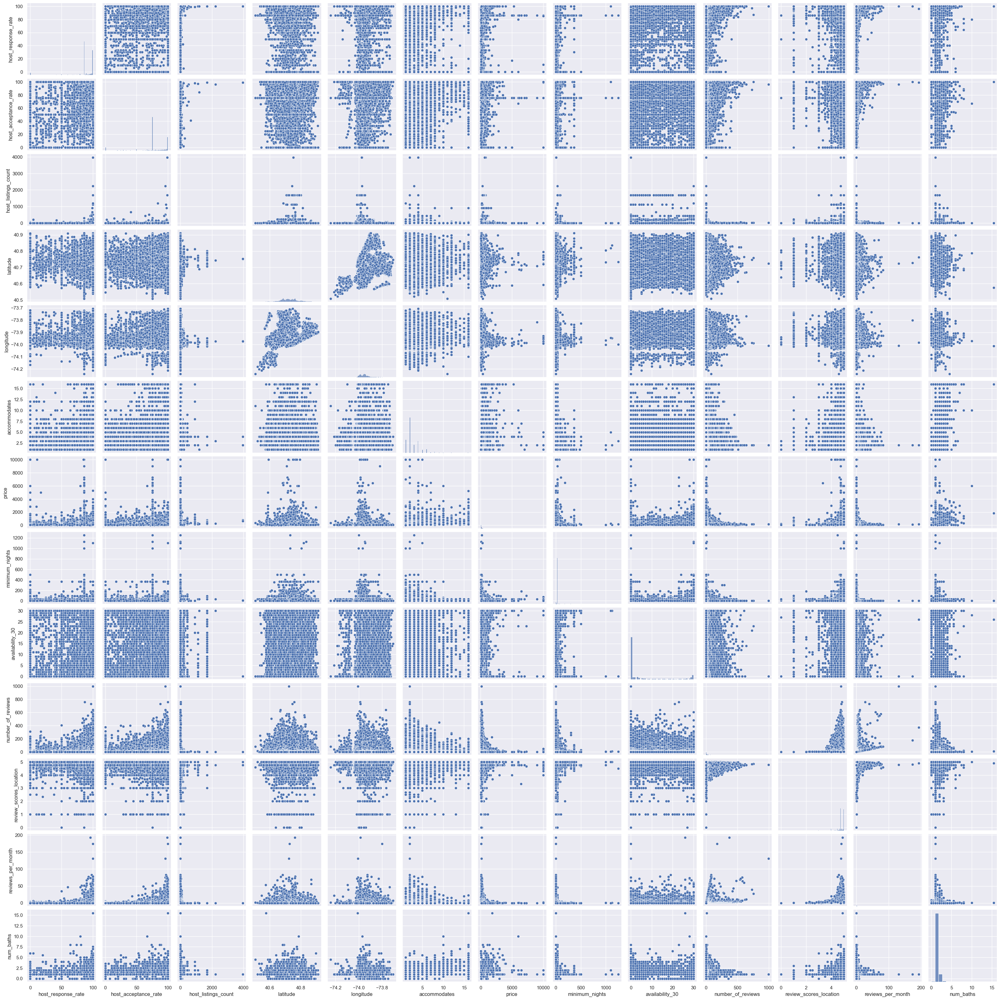

In [231]:
num_cols = listings2.select_dtypes([np.int16,np.float64]).columns
num_cols = listings2[num_cols]
sns.pairplot(num_cols)

One-hot encode categorical variables then drop originals.

In [232]:
Categoricals_to_convert = ['host_response_time','neighbourhood_group_cleansed','room_type','bath_type','room_privacy','domicile_type']

# using pd get dummies for the category columns we are keeping
dummies = pd.get_dummies(listings2[Categoricals_to_convert],drop_first=True)

#dropping original columns
listings_df = listings2.drop(Categoricals_to_convert,axis=1)

#concating dummies to the data frame
listings_df = pd.concat([listings_df,dummies],axis=1)

#convert boolean variables to int so they can be included in VIF calculations
boolean_variables = ['host_has_profile_pic', 'host_identity_verified', 'has_availability', 'instant_bookable']
listings_df[boolean_variables] = listings_df[boolean_variables].astype(int)

listings_df.head()

,host_response_rate,host_acceptance_rate,host_listings_count,latitude,longitude,accommodates,price,minimum_nights,availability_30,number_of_reviews,review_scores_location,reviews_per_month,host_has_profile_pic,host_identity_verified,has_availability,instant_bookable,num_baths,host_response_time_missing,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_group_cleansed_Brooklyn,neighbourhood_group_cleansed_Manhattan,neighbourhood_group_cleansed_Queens,neighbourhood_group_cleansed_Staten Island,room_type_Hotel room,room_type_Private room,room_type_Shared room,bath_type_shared,room_privacy_private-room,room_privacy_shared-room,domicile_type_boutique-hotel,domicile_type_condo,domicile_type_guest-suite,domicile_type_guesthouse,domicile_type_home,domicile_type_hostel,domicile_type_hotel,domicile_type_loft,domicile_type_rental-unit,domicile_type_serviced-apartment,domicile_type_townhouse,domicile_type_OTHER
0,86.330958,75.619603,6,40.75356,-73.98559,1,150.0,30,6,48,4.86,0.34,1,1,1,0,1.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,50.000000,88.000000,1,40.68494,-73.95765,3,75.0,1,0,408,4.72,5.09,1,1,1,0,1.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,88.000000,33.000000,1,40.66265,-73.99454,4,275.0,5,7,1,4.00,0.01,1,1,1,0,1.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,100.000000,100.000000,1,40.76457,-73.98317,2,61.0,2,3,485,4.86,3.63,1,0,1,0,1.0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
5,86.330958,75.619603,1,40.80380,-73.96751,1,75.0,2,0,118,4.94,0.90,1,1,1,0,1.0,1,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0


<AxesSubplot:>

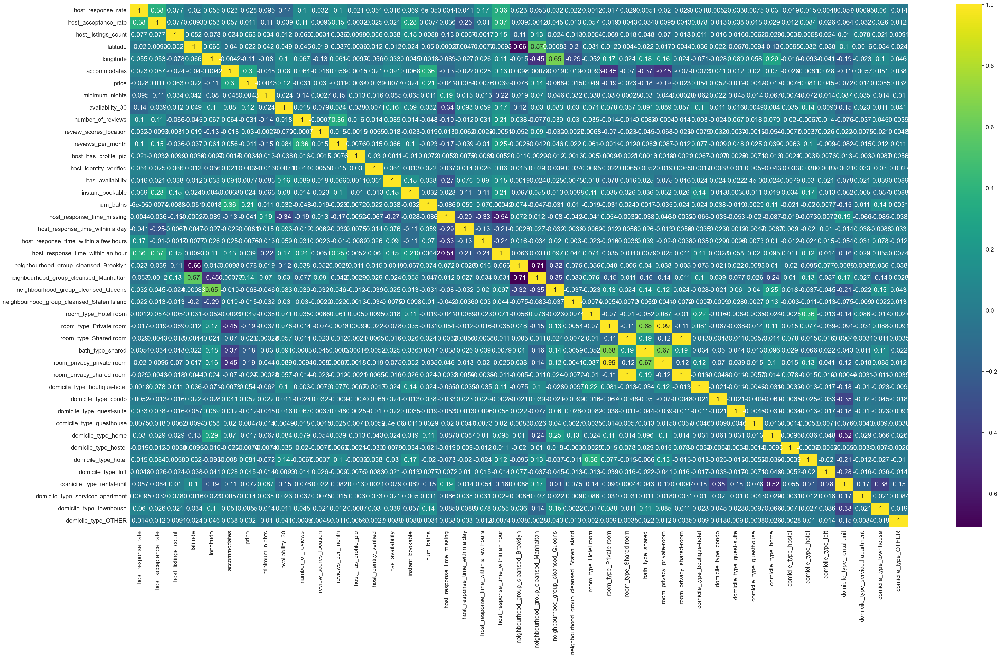

In [233]:
plt.figure(figsize=(48,26))
sns.set(font_scale=1.5)
sns.heatmap(listings_df.corr(),annot=True,cmap='viridis')

room_privacy has high correlation with room_type and bath_type so we dicided to drop room_privacy from the dataset.

In [234]:
listings_df.drop(['room_privacy_private-room','room_privacy_shared-room'], axis=1, inplace=True)

In [235]:
listings_df.head()

,host_response_rate,host_acceptance_rate,host_listings_count,latitude,longitude,accommodates,price,minimum_nights,availability_30,number_of_reviews,review_scores_location,reviews_per_month,host_has_profile_pic,host_identity_verified,has_availability,instant_bookable,num_baths,host_response_time_missing,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_group_cleansed_Brooklyn,neighbourhood_group_cleansed_Manhattan,neighbourhood_group_cleansed_Queens,neighbourhood_group_cleansed_Staten Island,room_type_Hotel room,room_type_Private room,room_type_Shared room,bath_type_shared,domicile_type_boutique-hotel,domicile_type_condo,domicile_type_guest-suite,domicile_type_guesthouse,domicile_type_home,domicile_type_hostel,domicile_type_hotel,domicile_type_loft,domicile_type_rental-unit,domicile_type_serviced-apartment,domicile_type_townhouse,domicile_type_OTHER
0,86.330958,75.619603,6,40.75356,-73.98559,1,150.0,30,6,48,4.86,0.34,1,1,1,0,1.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,50.000000,88.000000,1,40.68494,-73.95765,3,75.0,1,0,408,4.72,5.09,1,1,1,0,1.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,88.000000,33.000000,1,40.66265,-73.99454,4,275.0,5,7,1,4.00,0.01,1,1,1,0,1.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,100.000000,100.000000,1,40.76457,-73.98317,2,61.0,2,3,485,4.86,3.63,1,0,1,0,1.0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,86.330958,75.619603,1,40.80380,-73.96751,1,75.0,2,0,118,4.94,0.90,1,1,1,0,1.0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0


### **A closer look on response variable, price**

From the histogram and qq-plot, the variable show heavily righ-skewed distribution.

Skewness: 19.876857
Kurtosis: 572.762624


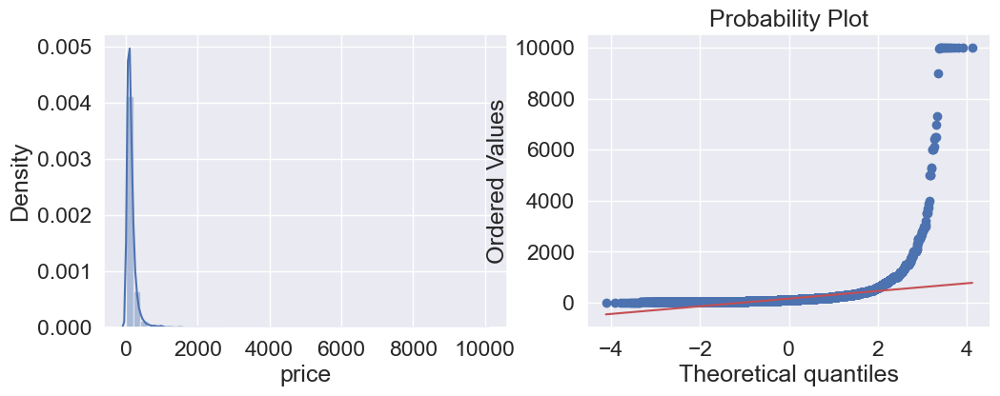

In [236]:
import matplotlib
import scipy.stats as stats
import warnings
warnings.filterwarnings("ignore")

fig, ax = plt.subplots(1,2, figsize=(12,4))

sns.distplot(listings_df['price'], ax=ax[0])
stats.probplot(listings_df['price'], dist="norm", plot=ax[1])

print("Skewness: %f" % listings_df['price'].skew())
print("Kurtosis: %f" % listings_df['price'].kurt())

Log transformation might help making the response variable more normally distributed.

Skewness: 0.704550
Kurtosis: 1.485291


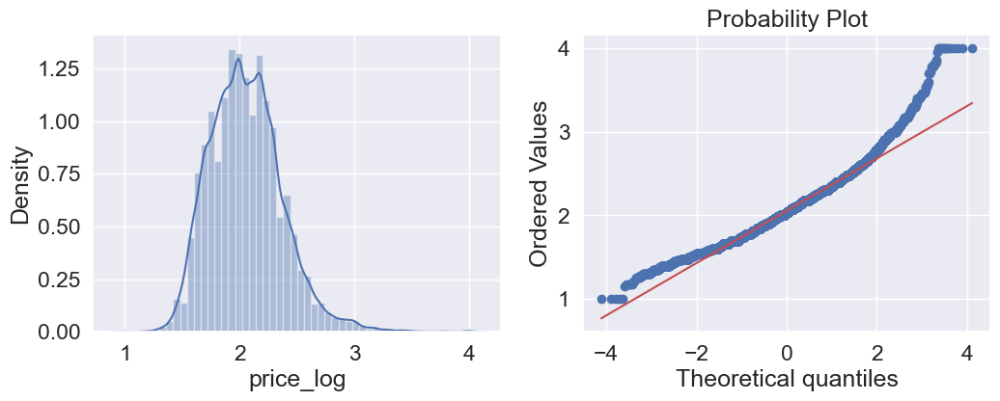

In [237]:
listings_df['price_log'] = np.log10(listings_df['price'])

fig, ax = plt.subplots(1,2, figsize=(12,4))

sns.distplot(listings_df['price_log'], ax=ax[0])
stats.probplot(listings_df['price_log'], dist="norm", plot=ax[1])

print("Skewness: %f" % listings_df['price_log'].skew())
print("Kurtosis: %f" % listings_df['price_log'].kurt())

With log transformation, both histogram and QQ plot still show some right skewed distribution.

We then dig into more details for each extremely high and low price listings by going through their urls.  We found that:

**All listings above 5,000 USD** are either 
- Hotel advertisement lisitings with zero availability which do not allow guests to book through Airbnb
- Normal listings with zero availability which do not allow guests to book and/or hosts have not been active for over a year.  This looks like the hosts set the extremely high price to deactivate the listings without deleting from Airbnb website.

**All listings below 14 USD** (yes!  you can stay in NYC for 14 USD a night, exchange for cats sittng for the host) are either
- Hotel advertisement lisitings with zero availability which do not allow guests to book through Airbnb
- Normal listings with zero availability which do not allow guests to book.  This looks like the hosts set the extremely low price to deactivate the listings without deleting from Airbnb website.

We decided to leave the listings less than 14 USD and above 5,000 USD out from the dataset.  The histogram and QQ plot still shows little right skewed distribution but over all look more normally distributed.

Skewness: 0.589623
Kurtosis: 0.768479


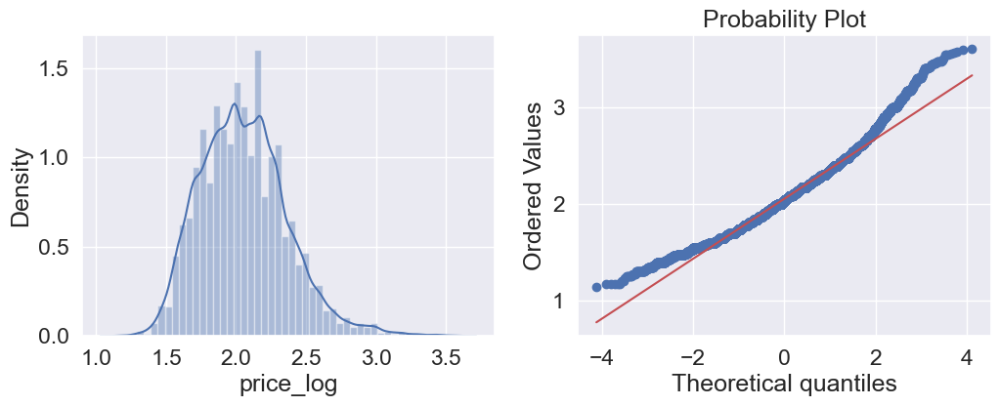

In [238]:
listings_cleaned = listings_df[(listings_df.price >= 14) & (listings_df.price < 5000)]
listings_cleaned['price_log'] = np.log10(listings_cleaned['price'])

fig, ax = plt.subplots(1,2, figsize=(12,4))

sns.distplot(listings_cleaned['price_log'], ax=ax[0])
stats.probplot(listings_cleaned['price_log'], dist="norm", plot=ax[1])

print("Skewness: %f" % listings_cleaned['price_log'].skew())
print("Kurtosis: %f" % listings_cleaned['price_log'].kurt())

---
> ## Describe The Final Dataset that is used for classification/Regression
>
(include a description of any newly formed variables you created).

> #### [5 points]

### Host Level Dataset for Superhost Classification Task

In [239]:
host_df.shape

(25230, 15)

### Shape of final dataset
The final dataset that we will model with has 24,397 unqiue observations. with 15 columns that we will describe below. 

### Final Dataset Columns

* host_id - Host ID is a four-digit number that serves as a primary key for a host. Hosts are those who have rights to a certain property through ownership, leases or granted managerial authority. There is no limit to the number of properties they can list on Airbnb. Guests and Hosts have the abilitly to read one another’s profiles. Guests might be influenced by a Hosts reviews or status as a super host. Data type of int64. <br>
<br />
* rating_avg - The average score for all listings grouped by host_id from review_scores_rating. Guests who have stayed at a listing may rate the listing on a scale from 0-5. This score is averaged across all the hosts listings within NYC. 
* reviews_total - The total number of reviews a host has recieved. This number is aggregated across all listings associated with a host_id. <br>
<br />
* response_rate_median - This column takes the median value for a hosts reponse time across all their listings within NYC grouped by host id. The original column is a precentage of how often a host replies to an inquirty sent to them on the Airbnb website. <br>
<br />
* acceptance_rate_median - This column was made from grouping all hosts_acceptance_rate by host id and finidng the median value for each host. The original column, host_accpetance_rate, is continous value from 0-100 and is a percentage of how often a host will accpet a guests request to stay vs reject this request. Hosts can accept or reject a guests request to stay. This could be a factor of scheduling and timing. Or a factor of a guests poor rating. Hosts and guests rate one another after a stay. The cumulative rating servers as a social credit on the website. This can influence a hosts decision to accept a guests request to stay at their place. <br>
<br />
* total_nyc_listings - This column represents the total number of listings a host has available in NYC. By grouping host_calculated_listings by host id. Represented by an integer value. <br>
<br />
* accommodates_median - This column is the median number of a guests a particular host is able to lodge in NYC. values are represented by an integer type. <br>
<br />
* price_median - The is the median price of all the listings in NYC associated with a particular host. Values are represented by an integer type <br>
<br />
* availability_60_median - This is the median number of days a host has made their listings available. Group by host_id the original column is availability_60 The number of nights the listing is available within the next 60 days. The availability could be a factor of bookings. Can also be a factor of the host living in the property, since some properties listed on Airbnb are hosts primary residence.   <br>  
<br />
* reviews_duration_median - <br>

<br />
* <b>superhost_max</b> - Our Target variable. If a host meets requirements for superhost in one of the listings than the host is superhost for all their listings. Boolean value True / False stating whether host meets condition of currently having the the status of “Superhost”. From Airbnb website “Every 3 months, each host is evaluated on their hospitality. Superhosts meet all of the criteria – they’re highly rated, experienced, reliable, and responsive.” They must meet certain criteria of; 4.8+ rating, 10+ stays, 1% cancellation rate, and 90% response rate.  The number one benefit of being a Superhost is that it improves the visibility of your listings. For one, there is a super host only filter. Superhost properties are more likely to be featured in Airbnb newsletters and curated lists on the Airbnb website. Becoming a super host and sporting the superhost badge builds trust and allows guests to stand out from the crowd. Having the superhost badge my allow hosts to increase their rates. From the host tools website, “Guests expect a higher level of service and a better experience from Superhosts, so it’s likely that they’re willing to pay more.” [From Airbnb website: How to become a SuperHost](https://www.airbnb.com/help/article/829/how-do-i-become-a-superhost).<br>
<br />

The following columns are categorical dummy variables columns representing host response time - This column's data type is category that approximates how long it takes for a host to reply to an inquiry. The strings have a ordinal relationship. The fastest to slowest response are denoated as: “within an hour”, “within a few hours”, “within a day”, “a few days or more”. This information is available on the website to prospective guest.
* response_time_max_missing -  This column reflects those hosts who do not have any response time data. Probably emblematic of a new host. <br />
* response_time_max_within a day - Those hosts with the longest response time. A host who will respond within a day <br>
* response_time_max_within a few hours - Host response time generally takes a few hours to respond to inquires <br />
* response_time_max_within an hour -  Those hosts that will respond the fastest, within an hour. <br />

### Listings Dataset for Price Regression Task

In [240]:
listings_cleaned.shape

(35919, 42)

# **Joe**

___
# Modeling and Evaluation 
___

#### [70 points total]

> 
> ## Choose and explain your evaluation metrics
> 

i.e., accuracy, precision, recall, F-measure, or any metric we have discussed). Why are the measure(s) appropriate for analyzing the results of your modeling? Give a detailed explanation backing up any assertions.

> #### [10 points]

> 
> ## Choose the method you will use for dividing your data into training and testing splits
> 

i.e., are you using Stratified 10-fold cross validation? Why?). Explain why your chosen method is appropriate or use more than one method as appropriate.

> #### [10 points]

> 
> ## Create three different classification/regression models (e.g., random forest, KNN, and Logistic Regression).
> 

Two modeling techniques must be new (but the third could be SVM or logistic regression). Adjust parameters as appropriate to increase generalization

> #### [20 points]

# Split train and test datasets
- **host_df** is for classification task (Logistic regression included here)
- **listings** is for regression task

We're required to do:
- two classification tasks OR
- two regression tasks OR
- one classification task and one regression task

In [241]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn import metrics as mt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
import time

# **host_df** for classification task

---
# **listings_df** for Price Regression Task

Split the listings dataframe to preserve a validation set for comparing models after tuning on CV of initial train/test split. We are using the stratified shuffle split so the validation set is representative of classes, as well as random_state so the if this code is run multiple times we get the same splits for consistentcy

In [242]:
from sklearn.model_selection import train_test_split

listings_modeling, listings_validation = train_test_split(listings_cleaned, test_size=0.1, random_state=42)

In [243]:
print("Size of modeling set (to be CV split): ",listings_modeling.shape)
print("Size of hold back validation set: ",listings_validation.shape)

Size of modeling set (to be CV split):  (32327, 42)
Size of hold back validation set:  (3592, 42)


In [244]:
#Create X and Y for modeling
X_price = listings_modeling.drop(['price','price_log'],axis=1) #droping rating_max
Y_price = listings_modeling['price']
Y_price_log = listings_modeling['price_log']

In [245]:
#Create new X and Y for validation
X_price_valid = listings_validation.drop(['price','price_log'],axis=1) #droping rating_max
Y_price_valid = listings_validation['price']
Y_price_log_valid = listings_validation['price_log']

In [246]:
#Standard scale the data
from sklearn.preprocessing import StandardScaler
std = StandardScaler()

std.fit(X_price.values) # only std.fit on train set
X_price_std = std.transform(X_price.values)
X_price_valid_std = std.transform(X_price_valid.values)

## **Cross Validation**
Cross validation is performed using repeated holdout via ShuffleSplit()

- Ten folds are used
- The split is: 80% training data and 20% test data
- A random seed is set so the same random test and training splits are used each time cross validation is performed.

In [247]:
from sklearn.model_selection import ShuffleSplit

cv_price = ShuffleSplit(n_splits=10, test_size=0.2, random_state=27)

**Create functions to evaluate regression estimators**

Credit: <a>https://github.com/jakemdrew/DataMiningNotebooks/blob/master/07.%20Regression.ipynb</a>

For our regression models, MAE, MAPE, RMSE, and R-squared will be evaluated.

In [248]:
from sklearn.metrics import mean_absolute_error, make_scorer, mean_squared_error, r2_score

def rmse(y_actual, y_predicted):
    return np.sqrt(mean_squared_error(y_actual, y_predicted))

def mape(y_actual, y_predicted): 
    mask = y_actual != 0
    return (np.fabs(y_actual - y_predicted)/y_actual)[mask].mean() * 100

#Create scorers for rmse and mape functions
mae_scorer = make_scorer(score_func=mean_absolute_error, greater_is_better=False)
rmse_scorer = make_scorer(score_func=rmse, greater_is_better=False)
mape_scorer = make_scorer(score_func=mape, greater_is_better=False)
r2_scorer = make_scorer(score_func=r2_score, greater_is_better=True)

#Make scorer array to pass into cross_validate() function for producing mutiple scores for each cv fold.
errorScoring = {'MAE':  mae_scorer, 
                'RMSE': rmse_scorer,
                'MAPE': mape_scorer,
                'R2': r2_scorer
               } 

In [249]:
from sklearn.model_selection import cross_validate

def EvaluateRegressionEstimator(modelNme, regEstimator, X, y, x_valid, y_valid, cv):
    
    print('Parameterization of the best estimator:',regEstimator,'\n')

    scores = cross_validate(regEstimator, X, y, scoring=errorScoring, cv=cv, return_train_score=True)
    validScores = cross_validate(regEstimator, x_valid, y_valid, scoring=errorScoring, cv=cv, return_train_score=True)

    #cross val score sign-flips the outputs of MAE
    # https://github.com/scikit-learn/scikit-learn/issues/2439
    scores['test_MAE'] = scores['test_MAE'] * -1
    scores['test_MAPE'] = scores['test_MAPE'] * -1
    scores['test_RMSE'] = scores['test_RMSE'] * -1

    validScores['test_MAE'] = validScores['test_MAE'] * -1
    validScores['test_MAPE'] = validScores['test_MAPE'] * -1
    validScores['test_RMSE'] = validScores['test_RMSE'] * -1

    #print mean MAE for all folds 
    maeAvg = scores['test_MAE'].mean()
    print_str = "The average MAE for all cv folds is: \t\t\t {maeAvg:.5}"
    print(print_str.format(maeAvg=maeAvg))

    #print mean test_MAPE for all folds
    mape_avg = scores['test_MAPE'].mean()
    print_str = "The average MAE percentage (MAPE) for all cv folds is: \t {mape_avg:.5}"
    print(print_str.format(mape_avg=mape_avg))

    #print mean RMSE for all folds 
    RMSEavg = scores['test_RMSE'].mean()
    print_str = "The average RMSE for all cv folds is: \t\t\t {RMSEavg:.5}"
    print(print_str.format(RMSEavg=RMSEavg))

    #print R2 for all folds 
    R2avg = scores['test_R2'].mean()
    print_str = "The average R2 for all cv folds is: \t\t\t {R2avg:.5}"
    print(print_str.format(R2avg=R2avg))
    print('---------------------------------------------------------------------')

    model_stat = pd.DataFrame()
    model_stat['Model_name'] = [str(modelNme)]
    model_stat['MAE_model'] = scores['test_MAE'].mean()
    model_stat['MAPE_model'] = scores['test_MAPE'].mean()
    model_stat['RMSE_model'] = scores['test_RMSE'].mean()
    model_stat['R2_model'] = scores['test_R2'].mean()
    model_stat['MAE_validation'] = validScores['test_MAE'].mean()
    model_stat['MAPE_validation'] = validScores['test_MAPE'].mean()
    model_stat['RMSE_validation'] = validScores['test_RMSE'].mean()
    model_stat['R2_validation'] = validScores['test_R2'].mean()

    print('Cross Validation Fold Mean Error Scores')
    scoresResults = pd.DataFrame()
    scoresResults['MAE'] = scores['test_MAE']
    scoresResults['MAPE'] = scores['test_MAPE']
    scoresResults['RMSE'] = scores['test_RMSE']
    scoresResults['R2'] = scores['test_R2']
    print(scoresResults)
    
    return model_stat

**Create Function for Prediction Error, Residual and Cook's D Plots**

In [250]:
#Create function for residuals plots
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError
from yellowbrick.regressor import CooksDistance

def residualPlot(model, x_train, y_train, x_test, y_test):
    print('\n*********************************************\nPrediction Error, Residual and Cook\'s D Plots\n*********************************************')

    predictions = model.predict(x_train)
    residuals = y_train - predictions
    model_norm_residuals_abs_sqrt = np.sqrt(np.abs(residuals))

    plt.subplots(1, 2, figsize=(14, 4))
    plt.subplot(121)
    visualizer = PredictionError(model)
    visualizer.fit(x_train, y_train)
    visualizer.score(x_test, y_test)
    visualizer.finalize()

    plt.subplot(122)
    visualizer = ResidualsPlot(model, hist=False, qqplot=True)
    visualizer.fit(x_train, y_train)
    visualizer.score(x_test, y_test)
    visualizer.show()
    plt.show()

    plt.subplots(1, 2, figsize=(13,4))    
    plt.subplot(121)
    sns.regplot(predictions, model_norm_residuals_abs_sqrt,
                scatter=True,
                lowess=True,
                line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})
    plt.ylabel("Standarized residuals")
    plt.xlabel("Fitted value")

    y = np.array(y_train, dtype=float)
    x = np.array(x_train, dtype=float)
    plt.subplot(122)
    visualizer = CooksDistance()
    visualizer.fit(x, y)
    visualizer.show()

In [251]:
regModel_stat = pd.DataFrame()

## Linear Regression with Grid Search
Here we perform a grid search testing 40 models to find the best parameters for our Linear Regression model based on Mean Absolute Error. 

In [252]:
#Create a Linear Regression object and perform a grid search to find the best parameters
from sklearn.linear_model import LinearRegression

linreg = LinearRegression()
parameters = {'fit_intercept':(True,False)}

#Create a grid search object using the  
from sklearn.model_selection import GridSearchCV
regGridSearch = GridSearchCV(estimator=linreg
                   , verbose=1 # low verbosity
                   , param_grid=parameters
                   , cv=cv_price # KFolds = 10
                   , scoring=mae_scorer)

#Perform hyperparameter search to find the best combination of parameters for our data
regGridSearch.fit(X_price_std, Y_price_log)

Fitting 10 folds for each of 2 candidates, totalling 20 fits


GridSearchCV(cv=ShuffleSplit(n_splits=10, random_state=27, test_size=0.2, train_size=None),
             estimator=LinearRegression(),
             param_grid={'fit_intercept': (True, False)},
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=1)

Parameterization of the best estimator: LinearRegression() 

The average MAE for all cv folds is: 			 0.14522
The average MAE percentage (MAPE) for all cv folds is: 	 7.0694
The average RMSE for all cv folds is: 			 0.19614
The average R2 for all cv folds is: 			 0.61134
---------------------------------------------------------------------
Cross Validation Fold Mean Error Scores
        MAE      MAPE      RMSE        R2
0  0.145824  7.075449  0.199398  0.597921
1  0.142100  6.955296  0.189517  0.620663
2  0.146068  7.129700  0.197906  0.607437
3  0.144202  7.038778  0.194665  0.612650
4  0.147351  7.171831  0.197746  0.628113
5  0.142892  6.979248  0.192791  0.631354
6  0.145045  7.059787  0.195740  0.602045
7  0.146364  7.096525  0.196585  0.614824
8  0.146061  7.089315  0.199158  0.590961
9  0.146333  7.097986  0.197858  0.607439

*********************************************
Prediction Error, Residual and Cook's D Plots
*********************************************


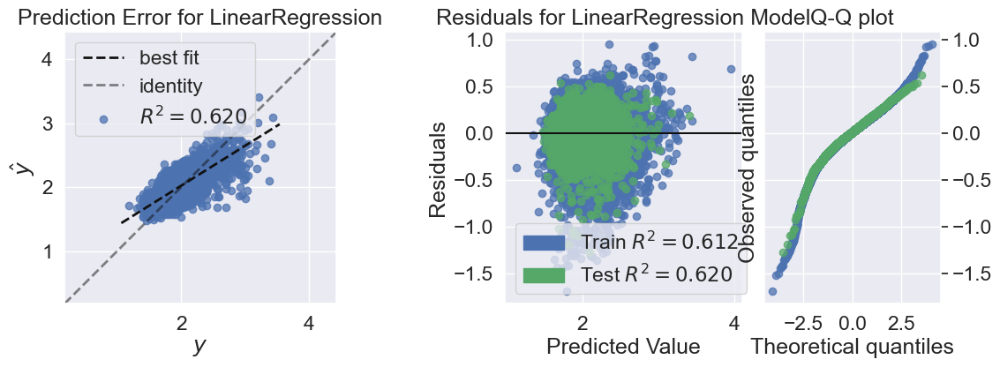

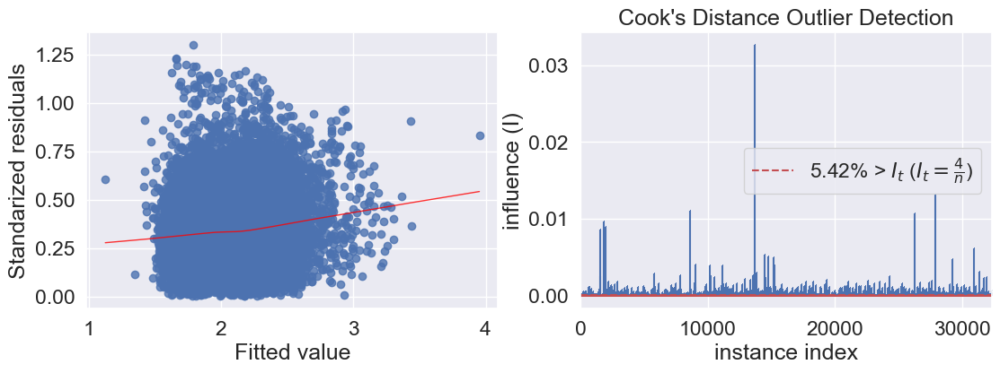

In [253]:
#Create CappedLinearRegression predictions between 0 and 100% using the best parameters for our Linear Regression object
regEstimator = regGridSearch.best_estimator_

#Evaluate the regression estimator above using our pre-defined cross validation and scoring metrics. 
l = EvaluateRegressionEstimator('Linear Regression', regEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid, cv_price)
regModel_stat = regModel_stat.append(l)

#Plot rediction Error, Residual and Cook's D
residualPlot(regEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid)

## Ridge Regression with Grid Search

In [254]:
#Create a regression object and perform a grid search to find the best parameters
from sklearn.linear_model import Ridge

ridgeReg = Ridge(fit_intercept=True, copy_X=True
                ,max_iter=1000, tol=0.0001, random_state=0)

#Test parameters 
ridgeAlpha = [0.001, 0.1, 1, 5, 10, 20]
ridgeSolver = [ 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
ridgeParameters = {'alpha': ridgeAlpha, 'solver': ridgeSolver}

#Create a grid search object using the parameters above
ridgeGridSearch = GridSearchCV(estimator=ridgeReg
                   , n_jobs=8 # jobs to run in parallel
                   , verbose=1 # low verbosity
                   , param_grid=ridgeParameters
                   , cv=cv_price # KFolds = 10
                   , scoring=mae_scorer)

#Perform hyperparameter search to find the best combination of parameters for our data
ridgeGridSearch.fit(X_price_std, Y_price_log)

Fitting 10 folds for each of 36 candidates, totalling 360 fits


GridSearchCV(cv=ShuffleSplit(n_splits=10, random_state=27, test_size=0.2, train_size=None),
             estimator=Ridge(max_iter=1000, random_state=0, tol=0.0001),
             n_jobs=8,
             param_grid={'alpha': [0.001, 0.1, 1, 5, 10, 20],
                         'solver': ['svd', 'cholesky', 'lsqr', 'sparse_cg',
                                    'sag', 'saga']},
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=1)

Parameterization of the best estimator: Ridge(alpha=0.001, max_iter=1000, random_state=0, solver='lsqr', tol=0.0001) 

The average MAE for all cv folds is: 			 0.14522
The average MAE percentage (MAPE) for all cv folds is: 	 7.0693
The average RMSE for all cv folds is: 			 0.19613
The average R2 for all cv folds is: 			 0.61135
---------------------------------------------------------------------
Cross Validation Fold Mean Error Scores
        MAE      MAPE      RMSE        R2
0  0.145821  7.075274  0.199399  0.597914
1  0.142098  6.955157  0.189518  0.620660
2  0.146067  7.129675  0.197905  0.607439
3  0.144198  7.038623  0.194664  0.612653
4  0.147343  7.171482  0.197731  0.628170
5  0.142893  6.979276  0.192790  0.631357
6  0.145045  7.059733  0.195739  0.602048
7  0.146363  7.096512  0.196582  0.614835
8  0.146060  7.089262  0.199161  0.590950
9  0.146334  7.097982  0.197860  0.607431

*********************************************
Prediction Error, Residual and Cook's D Plots
*****

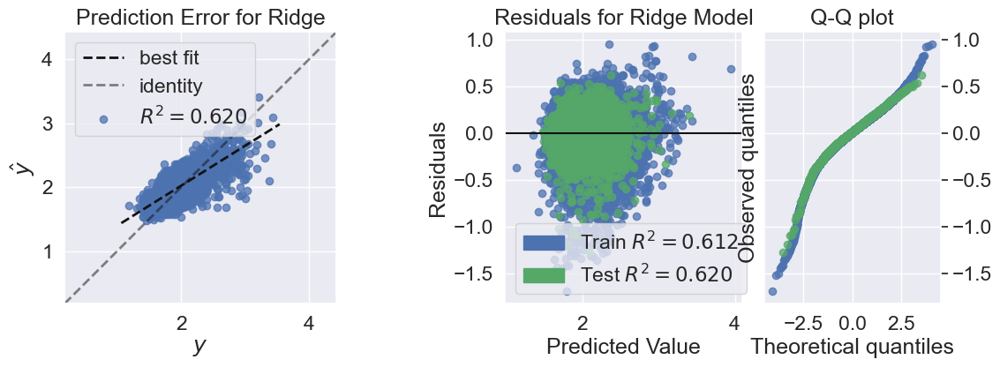

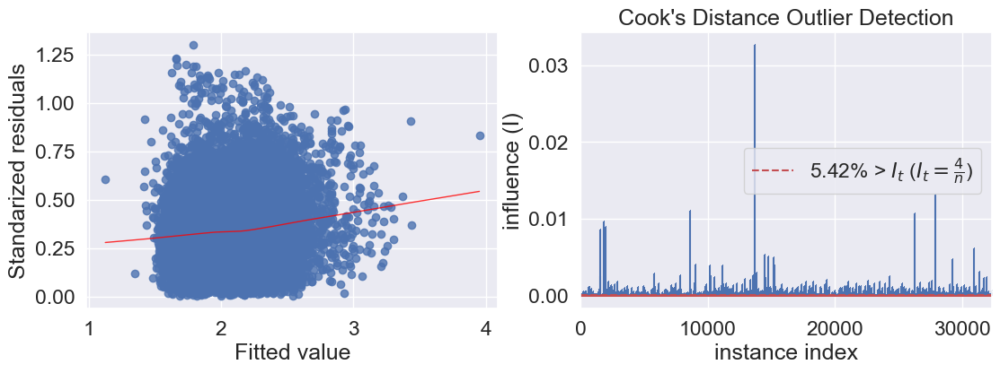

In [255]:
#Create CappedLinearRegression predictions between 0 and 100% using the best parameters for our Linear Regression object
ridgeEstimator = ridgeGridSearch.best_estimator_

#Evaluate the regression estimator above using our pre-defined cross validation and scoring metrics. 
r = EvaluateRegressionEstimator('Ridge Regression', ridgeEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid, cv_price)
regModel_stat = regModel_stat.append(r)

#Plot rediction Error, Residual and Cook's D
residualPlot(ridgeEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid)

## Lasso Regression

In [256]:
#Create a regression object and perform a grid search to find the best parameters
from sklearn.linear_model import Lasso


lassoReg = Lasso(fit_intercept=True, copy_X=True
           , max_iter=10000, precompute=True, tol=0.0001, random_state=0)

#Test parameters 
lassoAlpha = [0.001, 0.01, 0.1, 1, 10, 20]
lassoSelection = ['cyclic','random']
lassoWarm_start = [True, False]
lassoParameters = {'alpha': lassoAlpha, 'selection': lassoSelection, 'warm_start': lassoWarm_start}

#Create a grid search object using the parameters above
lassoGridSearch = GridSearchCV(estimator=lassoReg
                   , n_jobs=8 # jobs to run in parallel
                   , verbose=1 # low verbosity
                   , param_grid=lassoParameters
                   , cv=cv_price # KFolds = 10
                   , scoring=mae_scorer)

#Perform hyperparameter search to find the best combination of parameters for our data
lassoGridSearch.fit(X_price_std, Y_price_log)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


GridSearchCV(cv=ShuffleSplit(n_splits=10, random_state=27, test_size=0.2, train_size=None),
             estimator=Lasso(max_iter=10000, precompute=True, random_state=0),
             n_jobs=8,
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 10, 20],
                         'selection': ['cyclic', 'random'],
                         'warm_start': [True, False]},
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=1)

Parameterization of the best estimator: Lasso(alpha=0.001, max_iter=10000, precompute=True, random_state=0,
      warm_start=True) 

The average MAE for all cv folds is: 			 0.14528
The average MAE percentage (MAPE) for all cv folds is: 	 7.0727
The average RMSE for all cv folds is: 			 0.1962
The average R2 for all cv folds is: 			 0.61111
---------------------------------------------------------------------
Cross Validation Fold Mean Error Scores
        MAE      MAPE      RMSE        R2
0  0.145895  7.079373  0.199532  0.597378
1  0.142076  6.954702  0.189477  0.620822
2  0.146030  7.128939  0.197821  0.607773
3  0.144237  7.039698  0.194658  0.612676
4  0.147565  7.182876  0.198010  0.627121
5  0.142974  6.983773  0.193013  0.630505
6  0.145101  7.062617  0.195787  0.601855
7  0.146579  7.106637  0.196721  0.614292
8  0.145918  7.082518  0.199026  0.591504
9  0.146471  7.105370  0.197930  0.607154

*********************************************
Prediction Error, Residual and Cook's 

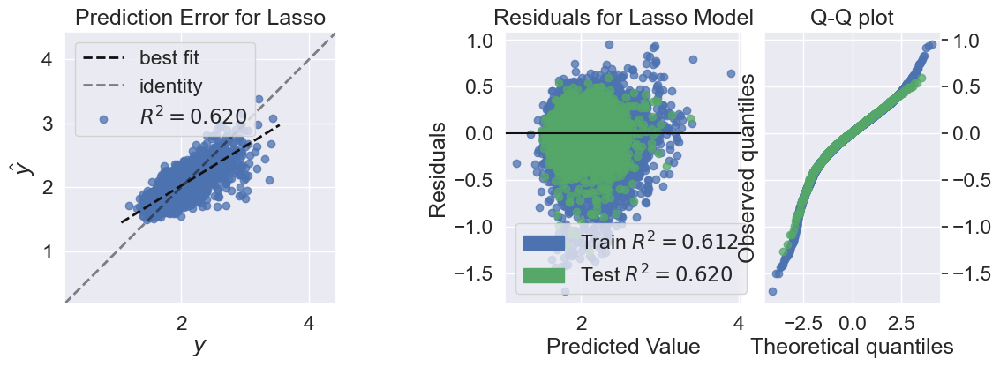

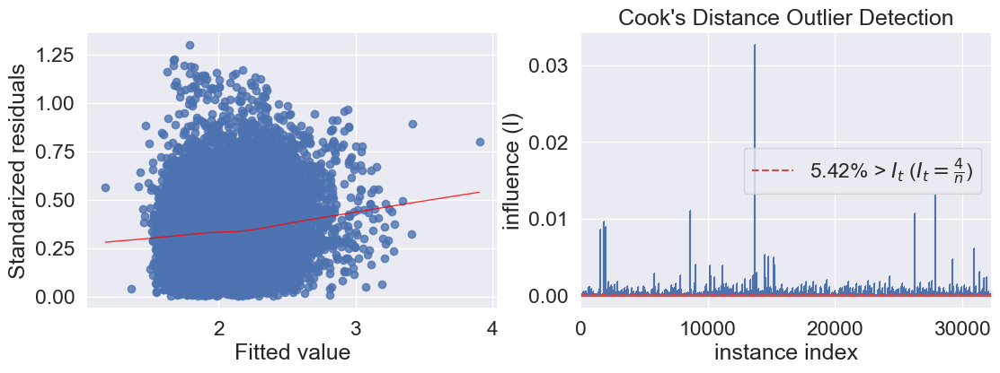

In [257]:
#Create CappedLinearRegression predictions between 0 and 100% using the best parameters for our Linear Regression object
lassoEstimator = lassoGridSearch.best_estimator_

#Evaluate the regression estimator above using our pre-defined cross validation and scoring metrics. 
ls = EvaluateRegressionEstimator('Lasso Regression', lassoEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid, cv_price)
regModel_stat = regModel_stat.append(ls)

#Plot rediction Error, Residual and Cook's D
residualPlot(lassoEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid)

## Elastic Net Regression

In [258]:
#Create a regression object and perform a grid search to find the best parameters
from sklearn.linear_model import ElasticNet

elasticNet = ElasticNet(fit_intercept=True, precompute=True, copy_X=True
          , max_iter=10000, tol=0.0001, random_state=0)
 
#Test parameters
elasticNetL1_ratio = [0.001, 0.01, 0.1, 0.5, 0.75, 1]
elasticNetAlpha = [0.001, 0.1, 1, 10]
elasticNetSelection = ['cyclic','random']
elasticNetWarm_start = [True, False]
elasticNetParameters = {'l1_ratio': elasticNetL1_ratio, 'alpha': elasticNetAlpha, 'selection': elasticNetSelection, 'warm_start': elasticNetWarm_start}

#Create a grid search object using the parameters above
elasticNetGridSearch = GridSearchCV(estimator=elasticNet
                   , n_jobs=8 # jobs to run in parallel
                   , verbose=1 # low verbosity
                   , param_grid=elasticNetParameters
                   , cv=cv_price # KFolds = 10
                   , scoring=mae_scorer)

#Perform hyperparameter search to find the best combination of parameters for our data
elasticNetGridSearch.fit(X_price_std, Y_price_log)

Fitting 10 folds for each of 96 candidates, totalling 960 fits


GridSearchCV(cv=ShuffleSplit(n_splits=10, random_state=27, test_size=0.2, train_size=None),
             estimator=ElasticNet(max_iter=10000, precompute=True,
                                  random_state=0),
             n_jobs=8,
             param_grid={'alpha': [0.001, 0.1, 1, 10],
                         'l1_ratio': [0.001, 0.01, 0.1, 0.5, 0.75, 1],
                         'selection': ['cyclic', 'random'],
                         'warm_start': [True, False]},
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=1)

Parameterization of the best estimator: ElasticNet(alpha=0.001, l1_ratio=0.001, max_iter=10000, precompute=True,
           random_state=0, selection='random', warm_start=True) 

The average MAE for all cv folds is: 			 0.14523
The average MAE percentage (MAPE) for all cv folds is: 	 7.0697
The average RMSE for all cv folds is: 			 0.19613
The average R2 for all cv folds is: 			 0.61136
---------------------------------------------------------------------
Cross Validation Fold Mean Error Scores
        MAE      MAPE      RMSE        R2
0  0.145828  7.075595  0.199394  0.597934
1  0.142102  6.955421  0.189510  0.620690
2  0.146064  7.129538  0.197888  0.607506
3  0.144213  7.039291  0.194666  0.612645
4  0.147368  7.172773  0.197756  0.628078
5  0.142905  6.979971  0.192796  0.631335
6  0.145049  7.059884  0.195733  0.602074
7  0.146372  7.096912  0.196576  0.614858
8  0.146057  7.089137  0.199145  0.591014
9  0.146339  7.098301  0.197857  0.607441

*************************************

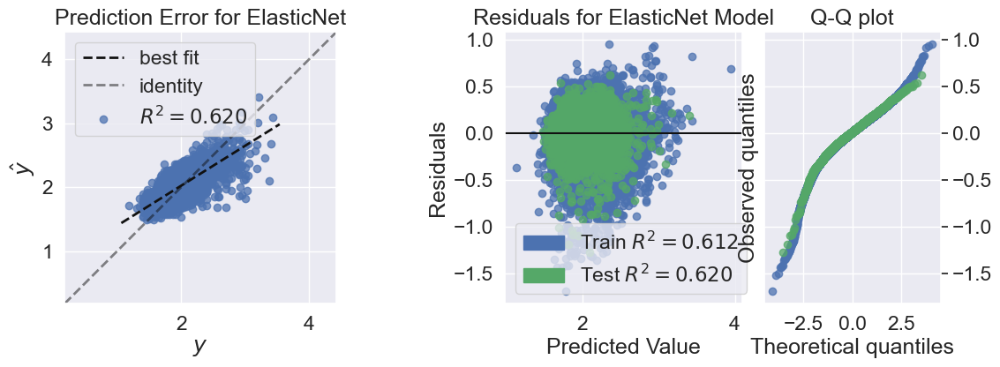

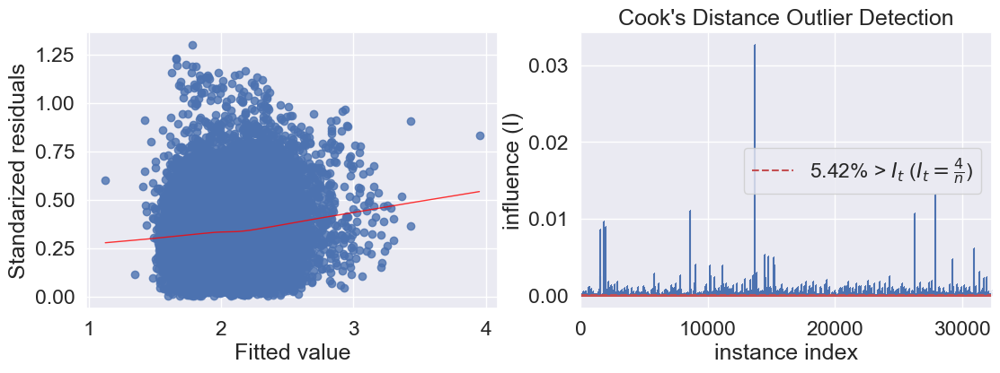

In [259]:
#Create CappedLinearRegression predictions between 0 and 100% using the best parameters for our Linear Regression object
elasticNetEstimator = elasticNetGridSearch.best_estimator_

#Evaluate the regression estimator above using our pre-defined cross validation and scoring metrics. 
e = EvaluateRegressionEstimator('Elastic Net Regression', elasticNetEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid, cv_price)
regModel_stat = regModel_stat.append(e)

#Plot rediction Error, Residual and Cook's D
residualPlot(elasticNetEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid)

## Support Vector Regression

In [260]:
#Create a Linear regression object and perform a grid search to find the best parameters
#from sklearn.svm import SVR
#svr = SVR()

#Set up SVR parameters to test (WARNING: Creates 80 models!!!) 
#svrCosts = [0.001, 0.1]
#svrDefGamma = 1 / X_price.shape[1]  #This is the default value for the gamma parameter
#svrGammas = [svrDefGamma, 0.1]
#svrKernels = ['rbf','linear']
#svrParameters = {'C': svrCosts, 'gamma' : svrGammas, 'kernel': svrKernels}

#Create a grid search object using the parameters above
#svrGridSearch = GridSearchCV(estimator=svr
#                   , n_jobs=4 # jobs to run in parallel
#                   , verbose=1 # low verbosity
#                   , param_grid=svrParameters
#                   , cv=cv_price # KFolds = 10
#                   , scoring=mae_scorer)

#Perform hyperparameter search to find the best combination of parameters for our data
#svrGridSearch.fit(X_price_std, Y_price_log)

In [261]:
#svrGridSearch.best_estimator_

In [262]:
#Best model is SVR(C=0.1, gamma=0.025)

from sklearn.svm import SVR
svrEstimator = SVR(C=0.1, gamma=0.025, verbose=1)

#Evaluate the regression estimator above using our pre-defined cross validation and scoring metrics. 
s = EvaluateRegressionEstimator('Support Vector Regression', svrEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid, cv_price)
regModel_stat = regModel_stat.append(s)

Parameterization of the best estimator: SVR(C=0.1, gamma=0.025, verbose=1) 

[LibSVM]........
*.*
optimization finished, #iter = 9932
obj = -145.766998, rho = -2.126139
nSV = 12584, nBSV = 11675
[LibSVM].......
*..*
optimization finished, #iter = 9790
obj = -147.670242, rho = -2.132986
nSV = 12584, nBSV = 11680
[LibSVM].......
*..*
optimization finished, #iter = 9918
obj = -145.483053, rho = -2.117838
nSV = 12600, nBSV = 11666
[LibSVM].......
*..*
optimization finished, #iter = 9978
obj = -146.703833, rho = -2.137389
nSV = 12546, nBSV = 11617
[LibSVM].......
*...*
optimization finished, #iter = 10030
obj = -146.040611, rho = -2.118912
nSV = 12557, nBSV = 11618
[LibSVM].......
*..*
optimization finished, #iter = 9796
obj = -146.800968, rho = -2.125936
nSV = 12560, nBSV = 11663
[LibSVM].......
*..*
optimization finished, #iter = 9880
obj = -146.708504, rho = -2.123687
nSV = 12602, nBSV = 11695
[LibSVM]........
*.*
optimization finished, #iter = 9916
obj = -146.238227, rho = -2.128579
nSV

## Regression using the Random Forest Regressor

In [263]:
# We use RandomizedSearchCV, which is less expensive than GridSearchCV for our dataset, to help find the best model

#from sklearn.ensemble import RandomForestRegressor
#rfReg = RandomForestRegressor()
#rfParameters = {'min_samples_split':[2,3,4,5]
#              ,'n_estimators' : [500]
#              ,'min_samples_leaf': [10, 25, 50]
#             }

#from sklearn.model_selection import RandomizedSearchCV

#rf_random = RandomizedSearchCV(estimator = rfReg, param_distributions = rfParameters, n_iter = 20, cv = cv_price, verbose=1, random_state=0, n_jobs=8, scoring=mae_scorer)

#rf_random.fit(X_price_std, Y_price_log)

In [264]:
#rf_random.best_estimator_

In [265]:
#Best model is RandomForestRegressor(min_samples_leaf=10, min_samples_split=5, n_estimators=500)

from sklearn.ensemble import RandomForestRegressor

rfRandomEstimator = RandomForestRegressor(min_samples_leaf=10, min_samples_split=5, n_estimators=500, n_jobs=8, random_state=0)

#Evaluate the regression estimator above using our pre-defined cross validation and scoring metrics. 
rf = EvaluateRegressionEstimator('Random Forrest Regressor', rfRandomEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid, cv_price)
regModel_stat = regModel_stat.append(rf)

Parameterization of the best estimator: RandomForestRegressor(min_samples_leaf=10, min_samples_split=5,
                      n_estimators=500, n_jobs=8, random_state=0) 

The average MAE for all cv folds is: 			 0.12303
The average MAE percentage (MAPE) for all cv folds is: 	 5.9577
The average RMSE for all cv folds is: 			 0.17356
The average R2 for all cv folds is: 			 0.69559
---------------------------------------------------------------------
Cross Validation Fold Mean Error Scores
        MAE      MAPE      RMSE        R2
0  0.124544  6.019571  0.177307  0.682075
1  0.121172  5.905690  0.168063  0.701687
2  0.123578  6.002640  0.175753  0.690401
3  0.122980  5.987228  0.172488  0.695879
4  0.123437  5.955510  0.174217  0.711349
5  0.120980  5.872604  0.169545  0.714895
6  0.123383  5.970322  0.174522  0.683644
7  0.122967  5.944488  0.171799  0.705829
8  0.123787  5.963254  0.177192  0.676214
9  0.123470  5.955474  0.174697  0.693964


## Regression using the Extra Trees Regressor

In [266]:
#from sklearn.ensemble import ExtraTreesRegressor
#
#etReg = ExtraTreesRegressor()
#etParameters = { 'min_samples_split':[2,3,4,5]
#              ,'n_estimators' : [500]
#              ,'min_samples_leaf': [10, 25, 50]
#             }

#from sklearn.model_selection import RandomizedSearchCV
#extraTrees = RandomizedSearchCV(estimator = etReg, param_distributions = etParameters, n_iter = 20, cv = cv_price, verbose=1, random_state=0, n_jobs=8, scoring=mae_scorer)

#extraTrees.fit(X_price_std, Y_price_log)

In [267]:
#extraTrees.best_estimator_

In [268]:
#Best model is ExtraTreesRegressor(min_samples_leaf=10, min_samples_split=3, n_estimators=500)

from sklearn.ensemble import ExtraTreesRegressor

etEstimator = ExtraTreesRegressor(min_samples_leaf=10, min_samples_split=3, n_estimators=500, verbose=1, n_jobs=8, random_state=0)

#Evaluate the regression estimator above using our pre-defined cross validation and scoring metrics. 
%time
et = EvaluateRegressionEstimator('Extra Trees Regressor', etEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid, cv_price)
regModel_stat = regModel_stat.append(et)

CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 µs
Wall time: 5.01 µs
Parameterization of the best estimator: ExtraTreesRegressor(min_samples_leaf=10, min_samples_split=3, n_estimators=500,
                    n_jobs=8, random_state=0, verbose=1) 



[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  52 tasks      | elapsed:    0.8s
[Parallel(n_jobs=8)]: Done 352 tasks      | elapsed:    4.5s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    6.2s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.4s finished
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent w

The average MAE for all cv folds is: 			 0.1246
The average MAE percentage (MAPE) for all cv folds is: 	 6.0362
The average RMSE for all cv folds is: 			 0.17506
The average R2 for all cv folds is: 			 0.69031
---------------------------------------------------------------------
Cross Validation Fold Mean Error Scores
        MAE      MAPE      RMSE        R2
0  0.126143  6.096979  0.178647  0.677253
1  0.122299  5.956460  0.169675  0.695935
2  0.125761  6.109786  0.178042  0.682285
3  0.123759  6.030626  0.172792  0.694804
4  0.125045  6.032744  0.175012  0.708708
5  0.122326  5.936753  0.172248  0.705730
6  0.124366  6.027653  0.175034  0.681787
7  0.125174  6.051647  0.173948  0.698424
8  0.125307  6.039710  0.178677  0.670766
9  0.125863  6.079293  0.176566  0.687381


[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.5s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.1s finished


## K Neighbors Regressor

In [310]:
#from sklearn.neighbors import KNeighborsRegressor
#neigh = KNeighborsRegressor()

#k_range = list(range(15))[1::2]

#neighParameters = { 'n_neighbors' : k_range
#                    , 'weights' : ['uniform', 'distance']
#                    , 'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
#                }

#neighGridSearch = GridSearchCV(estimator=neigh
#                   , n_jobs=8 # jobs to run in parallel
#                   , verbose=1 # low verbosity
#                   , param_grid=neighParameters
#                   , cv=cv_price # KFolds = 10
#                   , scoring=mae_scorer)
#neighGridSearch.fit(X_price_std, Y_price_log)


Fitting 10 folds for each of 56 candidates, totalling 560 fits


GridSearchCV(cv=ShuffleSplit(n_splits=10, random_state=27, test_size=0.2, train_size=None),
             estimator=KNeighborsRegressor(), n_jobs=8,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [1, 3, 5, 7, 9, 11, 13],
                         'weights': ['uniform', 'distance']},
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=1)

In [313]:
#neighGridSearch.best_estimator_

KNeighborsRegressor(algorithm='ball_tree', n_neighbors=11, weights='distance')

In [316]:
#Best model is KNeighborsRegressor(algorithm='ball_tree', n_neighbors=11, weights='distance')

from sklearn.neighbors import KNeighborsRegressor

knnEstimator = KNeighborsRegressor(algorithm='ball_tree', n_neighbors=11, weights='distance', n_jobs=8)

#Evaluate the regression estimator above using our pre-defined cross validation and scoring metrics. 
knnReg = EvaluateRegressionEstimator('K Neighbors Regressor', knnEstimator, X_price_std, Y_price_log, X_price_valid_std, Y_price_log_valid, cv_price)
regModel_stat = regModel_stat.append(knnReg)

Parameterization of the best estimator: KNeighborsRegressor(algorithm='ball_tree', n_jobs=8, n_neighbors=11,
                    weights='distance') 

The average MAE for all cv folds is: 			 0.13552
The average MAE percentage (MAPE) for all cv folds is: 	 6.5673
The average RMSE for all cv folds is: 			 0.18933
The average R2 for all cv folds is: 			 0.63781
---------------------------------------------------------------------
Cross Validation Fold Mean Error Scores
        MAE      MAPE      RMSE        R2
0  0.137512  6.675661  0.192990  0.623345
1  0.134201  6.547831  0.185500  0.636575
2  0.137702  6.681933  0.192438  0.628830
3  0.134242  6.525364  0.187303  0.641393
4  0.135123  6.510608  0.189385  0.658896
5  0.134329  6.524312  0.187526  0.651214
6  0.133125  6.460372  0.185292  0.643397
7  0.136374  6.590860  0.188815  0.644672
8  0.135595  6.544617  0.191924  0.620136
9  0.137000  6.611448  0.192171  0.629680


In [318]:
k_range = list(range(35))[1::2]

param_grid3 = { 'n_neighbors' : k_range
                    , 'weights' : ['distance']
                    , 'algorithm' : ['ball_tree']
                }

grid3 = GridSearchCV(neigh, param_grid3, cv=cv_price, scoring=mae_scorer)
grid3.fit(X_price_std, Y_price_log)

plt.plot(k_range, neighGridSearch.cv_results_['mean_test_score'])
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated MAE Score')

KeyboardInterrupt: 

In [317]:
regModel_stat

,Model_name,MAE_model,MAPE_model,RMSE_model,R2_model,MAE_validation,MAPE_validation,RMSE_validation,R2_validation
0,Linear Regression,0.145224,7.069392,0.196136,0.611341,0.142101,7.002354,0.189213,0.624147
0,Ridge Regression,0.145222,7.069298,0.196135,0.611346,0.142102,7.002388,0.189215,0.624140
0,Lasso Regression,0.145285,7.072650,0.196197,0.611108,0.141998,6.996813,0.188989,0.625047
0,Elastic Net Regression,0.145230,7.069682,0.196132,0.611358,0.142098,7.002219,0.189189,0.624245
0,Support Vector Regression,0.128951,6.220211,0.180649,0.670302,0.140474,6.874005,0.191813,0.613847
0,Random Forrest Regressor,0.123030,5.957678,0.173558,0.695594,0.134204,6.585853,0.181794,0.653171
0,Extra Trees Regressor,0.124604,6.036165,0.175064,0.690307,0.135845,6.671321,0.184451,0.642943
0,K Neighbors Regressor,0.135520,6.567301,0.189334,0.637814,0.153805,7.585791,0.205642,0.555977


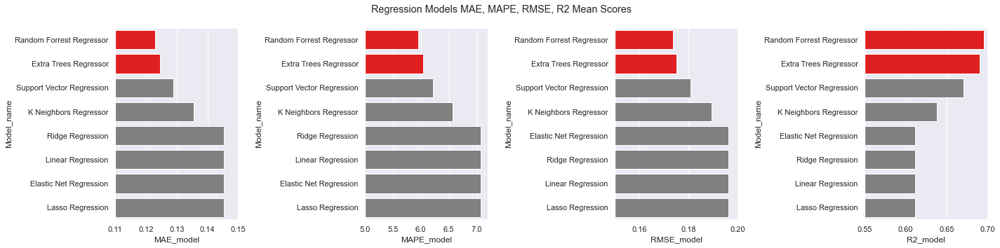

In [376]:
from heapq import nsmallest
from heapq import nlargest

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle('Regression Models MAE, MAPE, RMSE, R2 Mean Scores')

mae_model = np.array(regModel_stat.sort_values('MAE_model').MAE_model)
top2_maeModel = max(nsmallest(2, mae_model))
clrs1 = ['grey' if (x > top2_maeModel) else 'red' for x in mae_model]
sns.barplot(ax=axes[0], x="MAE_model", y="Model_name", data=regModel_stat.sort_values('MAE_model'), palette=clrs1)
axes[0].set_xlim(.11,.15)

mape_model = np.array(regModel_stat.sort_values('MAPE_model').MAPE_model)
top2_mapeModel = max(nsmallest(2, mape_model))
clrs2 = ['grey' if (x > top2_mapeModel) else 'red' for x in mape_model]
sns.barplot(ax=axes[1], x="MAPE_model", y="Model_name", data=regModel_stat.sort_values('MAPE_model'), palette=clrs2)
axes[1].set_xlim(5,7.2)

rmse_model = np.array(regModel_stat.sort_values('RMSE_model').RMSE_model)
top2_rmseModel = max(nsmallest(2, rmse_model))
clrs3 = ['grey' if (x > top2_rmseModel) else 'red' for x in rmse_model]
sns.barplot(ax=axes[2], x="RMSE_model", y="Model_name", data=regModel_stat.sort_values('RMSE_model'), palette=clrs3)
axes[2].set_xlim(.15,.2)

r2_model = np.array(regModel_stat.sort_values('R2_model', ascending=False).R2_model)
top2_r2Model = min(nlargest(2, r2_model))
clrs4 = ['grey' if (x < top2_r2Model) else 'red' for x in r2_model]
sns.barplot(ax=axes[3], x="R2_model", y="Model_name", data=regModel_stat.sort_values('R2_model', ascending=False), palette=clrs4)
axes[3].set_xlim(.55,.7)

plt.tight_layout()

### Best 2 models are Random Forrest Regressor and Extra Trees Regressor

From regression model matrics statistic summary table above, we can see the best mean MAE value for validation dataset are from Random Forrest Regression and Extra Trees Regression.  We then compare these two model mean MAE using hypothesis testing (t-test).

**Hypothesis Testing**
- H0: Both models have the same performance on the dataset.
- H1: Both models doesn’t have the same performance on the dataset.
- *Assume significance level at 0.05*

In [423]:
# Fit both models to validation dataset

# evaluate model 1 - Random Forrest Regression
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import ShuffleSplit

cv_regEva = ShuffleSplit(n_splits=10, test_size=0.2, random_state=27)

def MAEvalidation(modelNme, regEstimator, x_valid, y_valid):

    scores = cross_validate(regEstimator, x_valid, y_valid, scoring=mae_scorer, cv=cv_regEva, return_train_score=True)

    scores['test_score'] = scores['test_score'] * -1

    model_stat = pd.DataFrame()
    meanMAE_valid['Model_name'] = [str(modelNme)]
    meanMAE_valid['MAE_valid'] = scores['test_score'].mean()
    
    return meanMAE_valid, scores['test_score']

RegValidation = pd.DataFrame()

# Linear Regression
regValid, score1 = MAEvalidation('Linear Regression', regEstimator, X_price_valid_std, Y_price_log_valid)
RegValidation = RegValidation.append(regValid)

# Ridge Regression
ridgeValid, score2 = MAEvalidation('Ridge Regression', ridgeEstimator, X_price_valid_std, Y_price_log_valid)
RegValidation = RegValidation.append(ridgeValid)

# Lasso Regression
lsValid, score3 = MAEvalidation('Lasso Regression', lassoEstimator, X_price_valid_std, Y_price_log_valid)
RegValidation = RegValidation.append(lsValid)

# Elastic Net Regression
enValid, score4 = MAEvalidation('Elastic Net Regression', elasticNetEstimator, X_price_valid_std, Y_price_log_valid)
RegValidation = RegValidation.append(enValid)

# Support Vector Regression
svrValid, score5 = MAEvalidation('Support Vector Regression', svrEstimator, X_price_valid_std, Y_price_log_valid)
RegValidation = RegValidation.append(svrValid)

# Random Forrest Regressor
rfValid, score6 = MAEvalidation('Random Forrest Regressor', rfRandomEstimator, X_price_valid_std, Y_price_log_valid)
RegValidation = RegValidation.append(rfValid)

# Extra Trees Regressor
etValid, score7 = MAEvalidation('Extra Trees Regressor', etEstimator, X_price_valid_std, Y_price_log_valid)
RegValidation = RegValidation.append(etValid)

# K Neighbors Regressor
knnValid, score8 = MAEvalidation('K Neighbors Regressor', knnEstimator, X_price_valid_std, Y_price_log_valid)
RegValidation = RegValidation.append(knnValid)

#regValid

[LibSVM]*.*
optimization finished, #iter = 1161
obj = -19.338930, rho = -2.073757
nSV = 1503, nBSV = 1301
[LibSVM]*.*
optimization finished, #iter = 1262
obj = -19.853880, rho = -2.086215
nSV = 1542, nBSV = 1322
[LibSVM]*.*
optimization finished, #iter = 1277
obj = -19.457961, rho = -2.093526
nSV = 1526, nBSV = 1308
[LibSVM]*.*
optimization finished, #iter = 1245
obj = -19.690300, rho = -2.090996
nSV = 1547, nBSV = 1327
[LibSVM]*.*
optimization finished, #iter = 1169
obj = -19.472141, rho = -2.099320
nSV = 1506, nBSV = 1308
[LibSVM]*.*
optimization finished, #iter = 1173
obj = -19.587812, rho = -2.073405
nSV = 1487, nBSV = 1283
[LibSVM]*.*
optimization finished, #iter = 1266
obj = -19.885672, rho = -2.088269
nSV = 1508, nBSV = 1292
[LibSVM]*.*
optimization finished, #iter = 1205
obj = -19.671774, rho = -2.101299
nSV = 1510, nBSV = 1302
[LibSVM]*.*
optimization finished, #iter = 1306
obj = -19.792385, rho = -2.099636
nSV = 1550, nBSV = 1310
[LibSVM]*.*.*
optimization finished, #iter = 1

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.5s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed: 

In [424]:
RegValidation

,Model_name,MAE_valid
0,Linear Regression,0.142101
0,Ridge Regression,0.142102
0,Lasso Regression,0.141998
0,Elastic Net Regression,0.142098
0,Support Vector Regression,0.140474
0,Random Forrest Regressor,0.134204
0,Extra Trees Regressor,0.135845
0,K Neighbors Regressor,0.153805


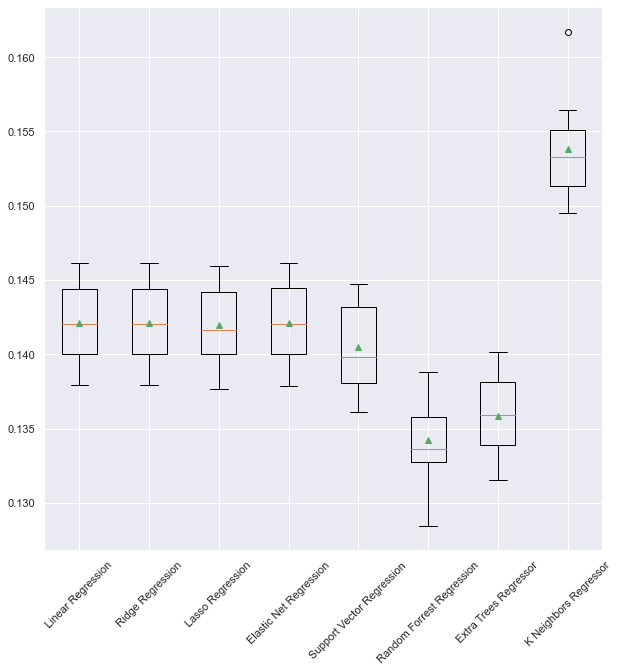

In [427]:
# plot the results
plt.figure(figsize=(10,10))
plt.boxplot([score1, score2, score3, score4, score5, score6, score7, score8]
            , labels=['Linear Regression','Ridge Regression','Lasso Regression','Elastic Net Regression','Support Vector Regression','Random Forrest Regression', 'Extra Trees Regressor', 'K Neighbors Regressor'], showmeans=True)
plt.xticks(rotation = 45)
plt.show()

In [383]:
from mlxtend.evaluate import paired_ttest_5x2cv

# check if difference between algorithms is real
t, p = paired_ttest_5x2cv(estimator1=model1, 
                          estimator2=model3, 
                          X=X_price_valid_std, 
                          y=Y_price_log_valid, 
                          scoring=mae_scorer, 
                          random_seed=27)

In [384]:
# summarize
print(f'The P-value is = {p:.6f}')
print(f'The t-statistics is = {t:.6f}')
# interpret the result
if p <= 0.05:
    print('Since p<0.05, We can reject the null-hypothesis that both models perform equally well on this dataset. We may conclude that the two algorithms are significantly different.')
else:
    print('Since p>0.05, we cannot reject the null hypothesis and may conclude that the performance of the two algorithms is not significantly different.')

The P-value is = 0.009108
The t-statistics is = 4.127384
Since p<0.05, We can reject the null-hypothesis that both models perform equally well on this dataset. We may conclude that the two algorithms are significantly different.


**Hypothesis Testing**

According to five steps process of hypothesis testing:
- H₀: μ₁= μ₂ = μ₃ = … = μ₆
- H₁: Not all salary means are equal
- α = 0.05

In [405]:
np.mean(scores1)

-0.14210120702124712

In [404]:
meanMAE_valid = pd.DataFrame()

meanMAE_valid['MAE'] = meanMAE_valid.append(np.mean(scores1))

meanMAE_valid

TypeError: cannot concatenate object of type '<class 'numpy.float64'>'; only Series and DataFrame objs are valid

## **Random Forrest Regressor is the best model** (lowest MAE)

# Regression Feature Importance for top model, Random Forrest Regressor

In [276]:
from sklearn.ensemble import RandomForestClassifier

randomForrestReg = RandomForestRegressor(min_samples_leaf=10, min_samples_split=5, n_estimators=500, n_jobs=8, random_state=0)

randomForrestReg.fit(X_price_all_std, Y_price_log_all)

RandomForestRegressor(min_samples_leaf=10, min_samples_split=5,
                      n_estimators=500, n_jobs=8, random_state=0)

In [277]:
#Load the model's coefficient weights and feature names into a dataframe sorted by weights
randomForrestReg_weights = randomForrestReg.feature_importances_.ravel()
randomForrestReg_feature_names = X_price_all.columns.values
randomForrestReg_ft_imp_df = pd.DataFrame({'feature_names':randomForrestReg_feature_names, 'weights':randomForrestReg_weights, 'absolute_weights': np.abs(randomForrestReg_weights)})
randomForrestReg_ft_imp_df.sort_values(by='absolute_weights', inplace=True, ascending=False )

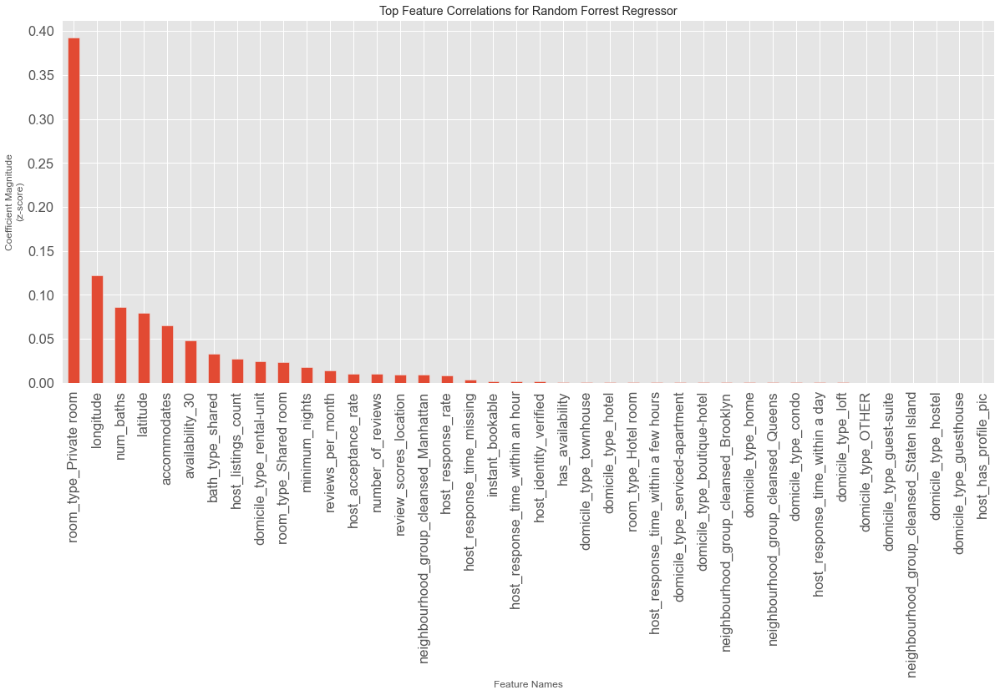

In [278]:
# Examine categorical variables of interest  
import matplotlib.pyplot as plt
%matplotlib inline

#Plot the model's feature importances
# REFERENCE:  Eric Larson, https://github.com/eclarson/DataMiningNotebooks
plt.style.use('ggplot')

randomForrestReg_wt_plt_df = randomForrestReg_ft_imp_df.head(75)

randomForrestReg_weights = pd.Series(randomForrestReg_wt_plt_df['weights'].values,index=randomForrestReg_wt_plt_df['feature_names'])
ax = randomForrestReg_weights.plot(kind='bar', figsize=(20,8))

ax.set_title("Top Feature Correlations for Random Forrest Regressor")
ax.set_ylabel("Coefficient Magnitude\n(z-score)")
ax.set_xlabel("Feature Names")
plt.show()

---

>
> ## Analyze the results using your chosen method of evaluation.
> 

Use visualizations of the results to bolster the analysis. Explain any visuals and analyze why they are interesting to someone that might use this model.

#### [10 points]

>
> ## Discuss the advantages of each model for each classification task
> 

(if any) If there are not advantages, explain why. Is any model better than another? Is the difference significant with 95% confidence? Use proper statistical comparison methods.

> #### [10 points]

>
> ## Which attributes from your analysis are most important?
> 

Use proper methods discussed in class to evaluate the importance of different attributes. Discuss the results and hypothesize about why certain attributes are more important than others for a given classification task.

> #### [10 points]

___
# Deployment 

How useful is your model for interested parties (i.e., the companies or organizations that might want to use it for prediction)? How would you measure the model's value if it was used by these parties? How would your deploy your model for interested parties? What other data should be collected? How often would the model need to be updated, etc.?
___
#### [5 points total]

___
# Exceptional Work 

You have free reign to provide additional modeling. One idea: grid search parameters in a parallelized fashion and visualize the performances across attributes. Which parameters are most significant for making a good model for each classification algorithm?
___
#### [10 points total]